## Siemens FPCA 

This code shows the implementation FPCA for reducing the dimension of the multiple time series after removing bad error codes.
It adds the scores and identify the time series which contribute the most to the principal components. 

**Index**

1. Loading the datasets
2. Transposing the time series datasets
3. Merging time series datasets to add additional features
4. Filtering and spliting in Blood and aqueous groups
5. Window extraction
   - 5.1. Validating if there are partial or full missing values after the extraction
7. Function to plot time series in one plot
8. Visualization of Time Series from the Windows
9. Functional PCA (Visualization of Principal Component Plots in one row)
    - 8.1. Functional PCA characterization function
        - 8.1.1. Functional PC1 plots (both systems) and Characterization of FPC Scores
     

The improvements with respect to the code "Siemens_PCA_FPCA.ipybn" are:
- The functional principal componet plots are display in one row **(WE CAN ADJUST Y_AXIS LIMITS OR PLOT THE DEFAULT ONES, HOWEVER, THE RANGE CAN BE DECEIVING)**.
- Creation of plots of the first principal component for both systems together and characterize the PC scores by mapping with colors the additional attributes.
- Correction in labelling by fluid type (blood and aqueous).
- Creation of the "Fluid_Type_Filled" column which fill NA's with ambient temperature values.
- Modification of the bins for the Functional PC scores scatterplots according to Siemens specifications.

## 1. Loading the datasets

In [1]:
# Import libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import altair as alt
import random
from sklearn.decomposition import PCA
from skfda.representation.grid import FDataGrid
from skfda.preprocessing.dim_reduction.projection import FPCA

/var/folders/_c/wdm33bq11dvflh73ffxrd8z40000gn/T/ipykernel_5205/2852243328.py:9: DeprecationWarning: The module "projection" is deprecated. Please use "dim_reduction"
  from skfda.preprocessing.dim_reduction.projection import FPCA


## 2. Transposing the time series datasets 

In [2]:
# Import datasets
sensorA_System1 = pd.read_csv("RawData/System1_SensorA.csv")
sensorA_System2 = pd.read_csv("RawData/System2_SensorA.csv")
sensorB_System1 = pd.read_csv("RawData/System1_SensorB.csv")
sensorB_System2 = pd.read_csv("RawData/System2_SensorB.csv")
sensorA_System1_missing = pd.read_csv("RawData/SensorA_System1_missing values.csv")
sensorA_System2_missing = pd.read_csv("RawData/SensorA_System2_missing values.csv")
keyByTestID = pd.read_csv("RawData/Key by TestID.csv", parse_dates=['DateTime'])

## 3. Merging time series datasets to add additional features

In [3]:
# Transpose dataset to make columns as timestamps and rows as tests

# Sensor A
A1_transposed = sensorA_System1.T.reset_index()
A1_transposed.columns = A1_transposed.iloc[0]
A1_transposed.rename(columns={A1_transposed.columns[0]: 'TestID'}, inplace=True)
A1_transposed = A1_transposed.drop(0)
A1_transposed['TestID'] = A1_transposed['TestID'].astype(int)

A2_transposed = sensorA_System2.T.reset_index()
A2_transposed.columns = A2_transposed.iloc[0]
A2_transposed.rename(columns={A2_transposed.columns[0]: 'TestID'}, inplace=True)
A2_transposed = A2_transposed.drop(0)
A2_transposed['TestID'] = A2_transposed['TestID'].astype(int)

A1_missing_transposed = sensorA_System1_missing.T.reset_index()
A1_missing_transposed.columns = A1_missing_transposed.iloc[0]
A1_missing_transposed.rename(columns={A1_missing_transposed.columns[0]: 'TestID'}, inplace=True)
A1_missing_transposed = A1_missing_transposed.drop(0)
A1_missing_transposed['TestID'] = A1_missing_transposed['TestID'].astype(int)

A2_missing_transposed = sensorA_System2_missing.T.reset_index()
A2_missing_transposed.columns = A2_missing_transposed.iloc[0]
A2_missing_transposed.rename(columns={A2_missing_transposed.columns[0]: 'TestID'}, inplace=True)
A2_missing_transposed = A2_missing_transposed.drop(0)
A2_missing_transposed['TestID'] = A2_missing_transposed['TestID'].astype(int)

# Sensor B
B1_transposed = sensorB_System1.T.reset_index()
B1_transposed.columns = B1_transposed.iloc[0]
B1_transposed.rename(columns={B1_transposed.columns[0]: 'TestID'}, inplace=True)
B1_transposed = B1_transposed.drop(0)
B1_transposed['TestID'] = B1_transposed['TestID'].astype(int)

B2_transposed = sensorB_System2.T.reset_index()
B2_transposed.columns = B2_transposed.iloc[0]
B2_transposed.rename(columns={B2_transposed.columns[0]: 'TestID'}, inplace=True)
B2_transposed = B2_transposed.drop(0)
B2_transposed['TestID'] = B2_transposed['TestID'].astype(int)

In [4]:
# Complete A1 and A2 with the missing values
A1_transposed_mid = A1_transposed[~A1_transposed.TestID.isin(A1_missing_transposed.TestID)]
A1_transposed = pd.concat([A1_transposed_mid, A1_missing_transposed], axis=0)
A2_transposed_mid = A2_transposed[~A2_transposed.TestID.isin(A2_missing_transposed.TestID)]
A2_transposed = pd.concat([A2_transposed_mid, A2_missing_transposed], axis=0)

In [5]:
# Create new column to fill fluid temperature NA's 
# Note: Fluid temperature: If specified, take as the temperature of the sample fluid. The rest of the system temperature can be taken as ambient temperature.

keyByTestID['Fluid_Temperature_Filled'] = keyByTestID['Fluid Temperature'].combine_first(keyByTestID['AmbientTemperature'])
keyByTestID.head(3)

,TestID,FluidType,DateTime,Lot,CardNumber,AgeOfCardInDaysAtTimeOfTest,ReaderSerialNumber,SampleDetectTime,BubbleDetectTime,System,Sensor,AmbientTemperature,Fluid Temperature,CardReturnCode,ReturnCode,Results Error Code,Device Return Code,Bge Test ReturnCode,Fluid_Temperature_Filled
0,3550995,Eurotrol L1,2024-02-07 10:32:15,16-23333-20,302910,70,73,180.4,178.8,System 2A,Sensor A,21.2345,NaN,NaN,Success,NoError,NoError,Success,21.2345
1,3550995,Eurotrol L1,2024-02-07 10:32:15,16-23333-20,302910,70,73,180.4,178.8,System 2A,Sensor B,21.2345,NaN,NaN,Success,NoError,NoError,Success,21.2345
2,3551012,Eurotrol L1,2024-02-07 10:41:33,16-23333-20,303096,70,73,183.2,181.6,System 2A,Sensor A,21.5012,NaN,NaN,Success,NoError,NoError,Success,21.5012


In [6]:
keyByTestID.tail(3)

,TestID,FluidType,DateTime,Lot,CardNumber,AgeOfCardInDaysAtTimeOfTest,ReaderSerialNumber,SampleDetectTime,BubbleDetectTime,System,Sensor,AmbientTemperature,Fluid Temperature,CardReturnCode,ReturnCode,Results Error Code,Device Return Code,Bge Test ReturnCode,Fluid_Temperature_Filled
24255,3518677,HNB,2023-09-19 16:54:21,16-23151-20,302186,111,23,459.0,454.8,System 2A,Sensor B,25.2250,15.0,NaN,Success,NoError,NoError,Success,15.0
24256,3518678,HNB,2023-09-19 16:54:23,16-23137-20,300820,125,33,459.2,455.2,System 2A,Sensor A,24.4908,15.0,NaN,Success,NoError,NoError,Success,15.0
24257,3518678,HNB,2023-09-19 16:54:23,16-23137-20,300820,125,33,459.2,455.2,System 2A,Sensor B,24.4908,15.0,NaN,Success,NoError,NoError,Success,15.0


In [7]:
# Merge dataset with keyByTestID and delete unmatched tests
keyByTestID['TestID'] = keyByTestID['TestID'].astype(int)
keyByTestID['System'] = keyByTestID['System'].astype(str)
keyByTestID = keyByTestID[keyByTestID['ReturnCode'].isin(['Success','UnderReportableRange'])]

A1_keyByTestID = keyByTestID[(keyByTestID['Sensor'] == 'Sensor A') & (keyByTestID['System'] == 'System 1')]
A1_Merged = pd.merge(A1_keyByTestID,A1_transposed,how='inner', on=['TestID'])
A1_transposed = A1_transposed[A1_transposed['TestID'].isin(A1_Merged['TestID'])]

A2_keyByTestID = keyByTestID.loc[(keyByTestID['Sensor'] == 'Sensor A') & (keyByTestID['System'] != 'System 1')]
A2_Merged = pd.merge(A2_keyByTestID,A2_transposed,how='inner', on=['TestID'])
A2_transposed = A2_transposed[A2_transposed['TestID'].isin(A2_Merged['TestID'])]

sensorA_System1 = sensorA_System1.loc[:, sensorA_System1.columns.isin(A1_Merged['TestID'].astype(str))]
sensorA_System2 = sensorA_System2.loc[:, sensorA_System2.columns.isin(A2_Merged['TestID'].astype(str))]


B1_keyByTestID = keyByTestID[(keyByTestID['Sensor'] == 'Sensor B') & (keyByTestID['System'] == 'System 1')]
B1_Merged = pd.merge(B1_keyByTestID,B1_transposed,how='inner', on=['TestID'])
B1_transposed = B1_transposed[B1_transposed['TestID'].isin(B1_Merged['TestID'])]

B2_keyByTestID = keyByTestID.loc[(keyByTestID['Sensor'] == 'Sensor B') & (keyByTestID['System'] != 'System 1')]
B2_Merged = pd.merge(B2_keyByTestID,B2_transposed,how='inner', on=['TestID'])
B1_transposed = B2_transposed[B2_transposed['TestID'].isin(A2_Merged['TestID'])]

sensorB_System1 = sensorB_System1.loc[:, sensorB_System1.columns.isin(B1_Merged['TestID'].astype(str))]
sensorB_System2 = sensorB_System2.loc[:, sensorB_System2.columns.isin(B2_Merged['TestID'].astype(str))]

print('A1: ', A1_Merged.shape)
print('A2: ', A2_Merged.shape)
print('B1: ', B1_Merged.shape)
print('B2: ', B2_Merged.shape)

A1:  (3382, 3377)
A2:  (7743, 3368)
B1:  (3375, 3377)
B2:  (7745, 3368)


## 4. Filtering and spliting in Blood and Aqueous groups

In [8]:
# Blood (any distinct from Eurotrol)
A1_blood_Merged = A1_Merged[~A1_Merged['FluidType'].isin(['Eurotrol L1', 'Eurotrol L3', 'Eurotrol L4', 'Eurotrol L5'])].copy()
A2_blood_Merged = A2_Merged[~A2_Merged['FluidType'].isin(['Eurotrol L1', 'Eurotrol L3', 'Eurotrol L4', 'Eurotrol L5'])].copy()
A1_blood_Merged.reset_index(drop=True, inplace=True)
A2_blood_Merged.reset_index(drop=True, inplace=True)

# Aqueous
A1_aqueous_Merged = A1_Merged[A1_Merged['FluidType'].isin(['Eurotrol L1', 'Eurotrol L3', 'Eurotrol L4', 'Eurotrol L5'])].copy()
A2_aqueous_Merged = A2_Merged[A2_Merged['FluidType'].isin(['Eurotrol L1', 'Eurotrol L3', 'Eurotrol L4', 'Eurotrol L5'])].copy()
A1_aqueous_Merged.reset_index(drop=True, inplace=True)
A2_aqueous_Merged.reset_index(drop=True, inplace=True)

# Blood (any distinct from Eurotrol)
B1_blood_Merged = (B1_Merged[~B1_Merged['FluidType'].isin(['Eurotrol L1', 'Eurotrol L3', 'Eurotrol L4', 'Eurotrol L5'])]).copy()
B2_blood_Merged = (B2_Merged[~B2_Merged['FluidType'].isin(['Eurotrol L1', 'Eurotrol L3', 'Eurotrol L4', 'Eurotrol L5'])]).copy()
B1_blood_Merged.reset_index(drop=True, inplace=True)
B2_blood_Merged.reset_index(drop=True, inplace=True)

# Aqueous 
B1_aqueous_Merged = (B1_Merged[B1_Merged['FluidType'].isin(['Eurotrol L1', 'Eurotrol L3', 'Eurotrol L4', 'Eurotrol L5'])]).copy()
B2_aqueous_Merged = (B2_Merged[B2_Merged['FluidType'].isin(['Eurotrol L1', 'Eurotrol L3', 'Eurotrol L4', 'Eurotrol L5'])]).copy()
B1_aqueous_Merged.reset_index(drop=True, inplace=True)
B2_aqueous_Merged.reset_index(drop=True, inplace=True)

## 5. Window extraction

In [9]:
# Match window values of Sensor A for each test
calDelimit = 11
cal_window_size = 8
sampleDelimit = 15
sample_window_size = 5

# Match window values of Sensor B for each test

# Blood
calDelLimit_sensorB_blood = 20
sampleDelLimit_sensorB_blood = 24
calWindowSize_sensorB_blood = 18
sampleWindowSize_sensorB_blood = 4

# Aqueous
calDelLimit_sensorB_aqueous = 20
sampleDelLimit_sensorB_aqueous = 30
calWindowSize_sensorB_aqueous = 18
sampleWindowSize_sensorB_aqueous = 4

# Define a function to calculate window start and end values
def calculate_window_values(bubble_start, sample_start, calDelimit_input, cal_window_size_input, sampleDelimit_input, sample_window_size_input):
    """
    Calculate the start and end values for calibration and sample windows. The calculation is based on given start points and delimiters for both windows, as well as the window sizes.

    Parameters:
    -----------
    bubble_start : float
        The starting point for the bubble (reference point for calibration).
    sample_start : float
        The starting point for the sample.
    calDelimit_input : float
        The delimiter value to adjust the starting point of the calibration window.
    cal_window_size_input : float
        The size of the calibration window.
    sampleDelimit_input : float
        The delimiter value to adjust the starting point of the sample window.
    sample_window_size_input : float
        The size of the sample window.

    Returns:
    --------
    tuple of float
        A tuple containing four values:
        - cal_window_start: The starting position of the calibration window, rounded to one decimal place.
        - cal_window_end: The ending position of the calibration window, rounded to one decimal place.
        - sample_window_start: The starting position of the sample window, rounded to one decimal place.
        - sample_window_end: The ending position of the sample window, rounded to one decimal place.
    """
    cal_window_start = bubble_start - calDelimit_input
    cal_window_end = cal_window_start + cal_window_size_input
    sample_window_start = sample_start + sampleDelimit_input
    sample_window_end = sample_window_start + sample_window_size_input
    return round(cal_window_start,1), round(cal_window_end,1), round(sample_window_start,1), round(sample_window_end,1)

# Sensor A
cal_window_start, cal_window_end, sample_window_start, sample_window_end = calculate_window_values(bubble_start=A1_Merged['BubbleDetectTime'],
                                                                                                   sample_start=A1_Merged['SampleDetectTime'],
                                                                                                   calDelimit_input=calDelimit,
                                                                                                   cal_window_size_input=cal_window_size,
                                                                                                   sampleDelimit_input=sampleDelimit,
                                                                                                   sample_window_size_input=sample_window_size)
A1_Merged['cal_window_start']=cal_window_start
A1_Merged['cal_window_end']=cal_window_end
A1_Merged['sample_window_start']=sample_window_start
A1_Merged['sample_window_end']=sample_window_end

cal_window_start, cal_window_end, sample_window_start, sample_window_end = calculate_window_values(bubble_start=A2_Merged['BubbleDetectTime'],
                                                                                                   sample_start=A2_Merged['SampleDetectTime'],
                                                                                                   calDelimit_input=calDelimit,
                                                                                                   cal_window_size_input=cal_window_size,
                                                                                                   sampleDelimit_input=sampleDelimit,
                                                                                                   sample_window_size_input=sample_window_size)
A2_Merged['cal_window_start']=cal_window_start
A2_Merged['cal_window_end']=cal_window_end
A2_Merged['sample_window_start']=sample_window_start
A2_Merged['sample_window_end']=sample_window_end


# Sensor A - Blood
cal_window_start, cal_window_end, sample_window_start, sample_window_end = calculate_window_values(bubble_start=A1_blood_Merged['BubbleDetectTime'],
                                                                                                   sample_start=A1_blood_Merged['SampleDetectTime'],
                                                                                                   calDelimit_input=calDelimit,
                                                                                                   cal_window_size_input=cal_window_size,
                                                                                                   sampleDelimit_input=sampleDelimit,
                                                                                                   sample_window_size_input=sample_window_size)
A1_blood_Merged['cal_window_start']=cal_window_start
A1_blood_Merged['cal_window_end']=cal_window_end
A1_blood_Merged['sample_window_start']=sample_window_start
A1_blood_Merged['sample_window_end']=sample_window_end


cal_window_start, cal_window_end, sample_window_start, sample_window_end = calculate_window_values(bubble_start=A2_blood_Merged['BubbleDetectTime'],
                                                                                                   sample_start=A2_blood_Merged['SampleDetectTime'],
                                                                                                   calDelimit_input=calDelimit,
                                                                                                   cal_window_size_input=cal_window_size,
                                                                                                   sampleDelimit_input=sampleDelimit,
                                                                                                   sample_window_size_input=sample_window_size)
A2_blood_Merged['cal_window_start']=cal_window_start
A2_blood_Merged['cal_window_end']=cal_window_end
A2_blood_Merged['sample_window_start']=sample_window_start
A2_blood_Merged['sample_window_end']=sample_window_end


# Sensor A - aqueous
cal_window_start, cal_window_end, sample_window_start, sample_window_end = calculate_window_values(bubble_start=A1_aqueous_Merged['BubbleDetectTime'],
                                                                                                   sample_start=A1_aqueous_Merged['SampleDetectTime'],
                                                                                                   calDelimit_input=calDelimit,
                                                                                                   cal_window_size_input=cal_window_size,
                                                                                                   sampleDelimit_input=sampleDelimit,
                                                                                                   sample_window_size_input=sample_window_size)
A1_aqueous_Merged['cal_window_start']=cal_window_start
A1_aqueous_Merged['cal_window_end']=cal_window_end
A1_aqueous_Merged['sample_window_start']=sample_window_start
A1_aqueous_Merged['sample_window_end']=sample_window_end


cal_window_start, cal_window_end, sample_window_start, sample_window_end = calculate_window_values(bubble_start=A2_aqueous_Merged['BubbleDetectTime'],
                                                                                                   sample_start=A2_aqueous_Merged['SampleDetectTime'],
                                                                                                   calDelimit_input=calDelimit,
                                                                                                   cal_window_size_input=cal_window_size,
                                                                                                   sampleDelimit_input=sampleDelimit,
                                                                                                   sample_window_size_input=sample_window_size)
A2_aqueous_Merged['cal_window_start']=cal_window_start
A2_aqueous_Merged['cal_window_end']=cal_window_end
A2_aqueous_Merged['sample_window_start']=sample_window_start
A2_aqueous_Merged['sample_window_end']=sample_window_end

# Sensor B - Blood
cal_window_start, cal_window_end, sample_window_start, sample_window_end = calculate_window_values(bubble_start=B1_blood_Merged['BubbleDetectTime'],
                                                                                                   sample_start=B1_blood_Merged['SampleDetectTime'],
                                                                                                   calDelimit_input=calDelLimit_sensorB_blood,
                                                                                                   cal_window_size_input=calWindowSize_sensorB_blood,
                                                                                                   sampleDelimit_input=sampleDelLimit_sensorB_blood,
                                                                                                   sample_window_size_input=sampleWindowSize_sensorB_blood)
B1_blood_Merged['cal_window_start']=cal_window_start
B1_blood_Merged['cal_window_end']=cal_window_end
B1_blood_Merged['sample_window_start']=sample_window_start
B1_blood_Merged['sample_window_end']=sample_window_end

cal_window_start, cal_window_end, sample_window_start, sample_window_end = calculate_window_values(bubble_start=B2_blood_Merged['BubbleDetectTime'],
                                                                                                   sample_start=B2_blood_Merged['SampleDetectTime'],
                                                                                                   calDelimit_input=calDelLimit_sensorB_blood,
                                                                                                   cal_window_size_input=calWindowSize_sensorB_blood,
                                                                                                   sampleDelimit_input=sampleDelLimit_sensorB_blood,
                                                                                                   sample_window_size_input=sampleWindowSize_sensorB_blood)
B2_blood_Merged['cal_window_start']=cal_window_start
B2_blood_Merged['cal_window_end']=cal_window_end
B2_blood_Merged['sample_window_start']=sample_window_start
B2_blood_Merged['sample_window_end']=sample_window_end


# Sensor B - aqueous
cal_window_start, cal_window_end, sample_window_start, sample_window_end = calculate_window_values(bubble_start=B1_aqueous_Merged['BubbleDetectTime'],
                                                                                                   sample_start=B1_aqueous_Merged['SampleDetectTime'],
                                                                                                   calDelimit_input=calDelLimit_sensorB_aqueous,
                                                                                                   cal_window_size_input=calWindowSize_sensorB_aqueous,
                                                                                                   sampleDelimit_input=sampleDelLimit_sensorB_aqueous,
                                                                                                   sample_window_size_input=sampleWindowSize_sensorB_aqueous)
B1_aqueous_Merged['cal_window_start']=cal_window_start
B1_aqueous_Merged['cal_window_end']=cal_window_end
B1_aqueous_Merged['sample_window_start']=sample_window_start
B1_aqueous_Merged['sample_window_end']=sample_window_end


cal_window_start, cal_window_end, sample_window_start, sample_window_end = calculate_window_values(bubble_start=B2_aqueous_Merged['BubbleDetectTime'],
                                                                                                   sample_start=B2_aqueous_Merged['SampleDetectTime'],
                                                                                                   calDelimit_input=calDelLimit_sensorB_aqueous,
                                                                                                   cal_window_size_input=calWindowSize_sensorB_aqueous,
                                                                                                   sampleDelimit_input=sampleDelLimit_sensorB_aqueous,
                                                                                                   sample_window_size_input=sampleWindowSize_sensorB_aqueous)
B2_aqueous_Merged['cal_window_start']=cal_window_start
B2_aqueous_Merged['cal_window_end']=cal_window_end
B2_aqueous_Merged['sample_window_start']=sample_window_start
B2_aqueous_Merged['sample_window_end']=sample_window_end

In [10]:
# Define a function to extract window data of each test
def calculate_window_data(row):
    """
    Extracts calibration and sample window data from a given row of time series data.

    Parameters:
    row (pd.Series): A pandas Series object containing time series data and window start/end times.
        The Series should have the following structure:
        - 'cal_window_start': The start time for the calibration window.
        - 'cal_window_end': The end time for the calibration window.
        - 'sample_window_start': The start time for the sample window.
        - 'sample_window_end': The end time for the sample window.
        - The index from position 19 to -4 should contain the timestamps (as float) of the time series data.

    Returns:
    tuple: A tuple containing two pandas Series:
        - The first Series corresponds to the data within the calibration window.
        - The second Series corresponds to the data within the sample window.
    """
    cal_start_time = row['cal_window_start']
    cal_end_time = row['cal_window_end']
    sample_start_time = row['sample_window_start']
    sample_end_time = row['sample_window_end']
    timestamps = row.index[19:-4].values.astype(float)
    cal_window = timestamps[(timestamps >= cal_start_time) & (timestamps <= cal_end_time)]
    sample_window = timestamps[(timestamps >= sample_start_time) & (timestamps <= sample_end_time)]
    return row[cal_window],row[sample_window]

# Sensor A

A1_cal_window = []
A1_sample_window = []
for i in range(len(A1_Merged)):
    cal_window, sample_window = calculate_window_data(A1_Merged.iloc[i, :])
    A1_cal_window.append(cal_window.values)
    A1_sample_window.append(sample_window.values)
A1_cal_window = pd.DataFrame(A1_cal_window)
A1_sample_window = pd.DataFrame(A1_sample_window)
A1_cal_window['TestID'] = A1_sample_window['TestID'] = A1_Merged['TestID']
A1_sample_window.set_index('TestID',inplace=True)
A1_cal_window.set_index('TestID',inplace=True)

A2_cal_window = []
A2_sample_window = []
for i in range(len(A2_Merged)):
    cal_window, sample_window = calculate_window_data(A2_Merged.iloc[i, :])
    A2_cal_window.append(cal_window.values)
    A2_sample_window.append(sample_window.values)
A2_cal_window = pd.DataFrame(A2_cal_window)
A2_sample_window = pd.DataFrame(A2_sample_window)
A2_cal_window['TestID'] = A2_sample_window['TestID'] = A2_Merged['TestID']
A2_sample_window.set_index('TestID',inplace=True)
A2_cal_window.set_index('TestID',inplace=True)

# System 1 - Sensor A - Blood

A1_blood_cal_window = []
A1_blood_sample_window = []
for i in range(len(A1_blood_Merged)):
    cal_window, sample_window = calculate_window_data(A1_blood_Merged.iloc[i, :])
    A1_blood_cal_window.append(cal_window.values)
    A1_blood_sample_window.append(sample_window.values)
A1_blood_cal_window = pd.DataFrame(A1_blood_cal_window)
A1_blood_sample_window = pd.DataFrame(A1_blood_sample_window)
A1_blood_cal_window['TestID'] = A1_blood_sample_window['TestID'] = A1_blood_Merged['TestID']
A1_blood_sample_window.set_index('TestID',inplace=True)
A1_blood_cal_window.set_index('TestID',inplace=True)

# System 1 - Sensor A - aqueous

A1_aqueous_cal_window = []
A1_aqueous_sample_window = []
for i in range(len(A1_aqueous_Merged)):
    cal_window, sample_window = calculate_window_data(A1_aqueous_Merged.iloc[i, :])
    A1_aqueous_cal_window.append(cal_window.values)
    A1_aqueous_sample_window.append(sample_window.values)
A1_aqueous_cal_window = pd.DataFrame(A1_aqueous_cal_window)
A1_aqueous_sample_window = pd.DataFrame(A1_aqueous_sample_window)
A1_aqueous_cal_window['TestID'] = A1_aqueous_sample_window['TestID'] = A1_aqueous_Merged['TestID']
A1_aqueous_sample_window.set_index('TestID',inplace=True)
A1_aqueous_cal_window.set_index('TestID',inplace=True)

# System 2 - Sensor A - Blood

A2_blood_cal_window = []
A2_blood_sample_window = []
for i in range(len(A2_blood_Merged)):
    cal_window, sample_window = calculate_window_data(A2_blood_Merged.iloc[i, :])
    A2_blood_cal_window.append(cal_window.values)
    A2_blood_sample_window.append(sample_window.values)
A2_blood_cal_window = pd.DataFrame(A2_blood_cal_window)
A2_blood_sample_window = pd.DataFrame(A2_blood_sample_window)
A2_blood_cal_window['TestID'] = A2_blood_sample_window['TestID'] = A2_blood_Merged['TestID']
A2_blood_sample_window.set_index('TestID',inplace=True)
A2_blood_cal_window.set_index('TestID',inplace=True)

# System 2 - Sensor A - aqueous

A2_aqueous_cal_window = []
A2_aqueous_sample_window = []
for i in range(len(A2_aqueous_Merged)):
    cal_window, sample_window = calculate_window_data(A2_aqueous_Merged.iloc[i, :])
    A2_aqueous_cal_window.append(cal_window.values)
    A2_aqueous_sample_window.append(sample_window.values)
A2_aqueous_cal_window = pd.DataFrame(A2_aqueous_cal_window)
A2_aqueous_sample_window = pd.DataFrame(A2_aqueous_sample_window)
A2_aqueous_cal_window['TestID'] = A2_aqueous_sample_window['TestID'] = A2_aqueous_Merged['TestID']
A2_aqueous_sample_window.set_index('TestID',inplace=True)
A2_aqueous_cal_window.set_index('TestID',inplace=True)

# System 1 - Sensor B - Blood

B1_blood_cal_window = []
B1_blood_sample_window = []
for i in range(len(B1_blood_Merged)):
    cal_window, sample_window = calculate_window_data(B1_blood_Merged.iloc[i, :])
    B1_blood_cal_window.append(cal_window.values)
    B1_blood_sample_window.append(sample_window.values)
B1_blood_cal_window = pd.DataFrame(B1_blood_cal_window)
B1_blood_sample_window = pd.DataFrame(B1_blood_sample_window)
B1_blood_cal_window['TestID'] = B1_blood_sample_window['TestID'] = B1_blood_Merged['TestID']
B1_blood_sample_window.set_index('TestID',inplace=True)
B1_blood_cal_window.set_index('TestID',inplace=True)

# System 2 - Sensor B - Blood

B2_blood_cal_window = []
B2_blood_sample_window = []
for i in range(len(B2_blood_Merged)):
    cal_window, sample_window = calculate_window_data(B2_blood_Merged.iloc[i, :])
    B2_blood_cal_window.append(cal_window.values)
    B2_blood_sample_window.append(sample_window.values)
B2_blood_cal_window = pd.DataFrame(B2_blood_cal_window)
B2_blood_sample_window = pd.DataFrame(B2_blood_sample_window)
B2_blood_cal_window['TestID'] = B2_blood_sample_window['TestID'] = B2_blood_Merged['TestID']
B2_blood_sample_window.set_index('TestID',inplace=True)
B2_blood_cal_window.set_index('TestID',inplace=True)

# System 1 - Sensor B - aqueous

B1_aqueous_cal_window = []
B1_aqueous_sample_window = []
for i in range(len(B1_aqueous_Merged)):
    cal_window, sample_window = calculate_window_data(B1_aqueous_Merged.iloc[i, :])
    B1_aqueous_cal_window.append(cal_window.values)
    B1_aqueous_sample_window.append(sample_window.values)
B1_aqueous_cal_window = pd.DataFrame(B1_aqueous_cal_window)
B1_aqueous_sample_window = pd.DataFrame(B1_aqueous_sample_window)
B1_aqueous_cal_window['TestID'] = B1_aqueous_sample_window['TestID'] = B1_aqueous_Merged['TestID']
B1_aqueous_sample_window.set_index('TestID',inplace=True)
B1_aqueous_cal_window.set_index('TestID',inplace=True)

# System 1 - Sensor B - Aqueous

B2_aqueous_cal_window = []
B2_aqueous_sample_window = []
for i in range(len(B2_aqueous_Merged)):
    cal_window, sample_window = calculate_window_data(B2_aqueous_Merged.iloc[i, :])
    B2_aqueous_cal_window.append(cal_window.values)
    B2_aqueous_sample_window.append(sample_window.values)
B2_aqueous_cal_window = pd.DataFrame(B2_aqueous_cal_window)
B2_aqueous_sample_window = pd.DataFrame(B2_aqueous_sample_window)
B2_aqueous_cal_window['TestID'] = B2_aqueous_sample_window['TestID'] = B2_aqueous_Merged['TestID']
B2_aqueous_sample_window.set_index('TestID',inplace=True)
B2_aqueous_cal_window.set_index('TestID',inplace=True)

## 5.1. Validating if there are partial or full missing values after the extraction

In [11]:
A1_cal_window_drop_index = A1_cal_window.loc[A1_cal_window.isna().sum(axis=1)!=0].index
A2_cal_window_drop_index = A2_cal_window.loc[A2_cal_window.isna().sum(axis=1)!=0].index

A1_blood_cal_window_drop_index = A1_blood_cal_window.loc[A1_blood_cal_window.isna().sum(axis=1)!=0].index
A1_aqueous_cal_window_drop_index = A1_aqueous_cal_window.loc[A1_aqueous_cal_window.isna().sum(axis=1)!=0].index
A2_blood_cal_window_drop_index = A2_blood_cal_window.loc[A2_blood_cal_window.isna().sum(axis=1)!=0].index
A2_aqueous_cal_window_drop_index = A2_aqueous_cal_window.loc[A2_aqueous_cal_window.isna().sum(axis=1)!=0].index

B1_blood_cal_window_drop_index = B1_blood_cal_window.loc[B1_blood_cal_window.isna().sum(axis=1)!=0].index
B1_aqueous_cal_window_drop_index = B1_aqueous_cal_window.loc[B1_aqueous_cal_window.isna().sum(axis=1)!=0].index
B2_blood_cal_window_drop_index = B2_blood_cal_window.loc[B2_blood_cal_window.isna().sum(axis=1)!=0].index
B2_aqueous_cal_window_drop_index = B2_aqueous_cal_window.loc[B2_aqueous_cal_window.isna().sum(axis=1)!=0].index

A1_sample_window_drop_index = A1_sample_window.loc[A1_sample_window.isna().sum(axis=1)!=0].index
A2_sample_window_drop_index = A2_sample_window.loc[A2_sample_window.isna().sum(axis=1)!=0].index

A1_blood_sample_window_drop_index = A1_blood_sample_window.loc[A1_blood_sample_window.isna().sum(axis=1)!=0].index
A1_aqueous_sample_window_drop_index = A1_aqueous_sample_window.loc[A1_aqueous_sample_window.isna().sum(axis=1)!=0].index
A2_blood_sample_window_drop_index = A2_blood_sample_window.loc[A2_blood_sample_window.isna().sum(axis=1)!=0].index
A2_aqueous_sample_window_drop_index = A2_aqueous_sample_window.loc[A2_aqueous_sample_window.isna().sum(axis=1)!=0].index

B1_blood_sample_window_drop_index = B1_blood_sample_window.loc[B1_blood_sample_window.isna().sum(axis=1)!=0].index
B1_aqueous_sample_window_drop_index = B1_aqueous_sample_window.loc[B1_aqueous_sample_window.isna().sum(axis=1)!=0].index
B2_blood_sample_window_drop_index = B2_blood_sample_window.loc[B2_blood_sample_window.isna().sum(axis=1)!=0].index
B2_aqueous_sample_window_drop_index = B2_aqueous_sample_window.loc[B2_aqueous_sample_window.isna().sum(axis=1)!=0].index

# Check if missing values in different windows is different
print("The missing value in calibration window:",A1_cal_window_drop_index)
print("The missing value in sample window:",A1_sample_window_drop_index)
print("The missing value in calibration window:",A2_cal_window_drop_index)
print("The missing value in sample window:",A2_sample_window_drop_index)

print("The missing value in calibration window:",B1_blood_cal_window_drop_index)
print("The missing value in sample window:",B1_blood_sample_window_drop_index)
print("The missing value in calibration window:",B2_blood_cal_window_drop_index)
print("The missing value in sample window:",B2_blood_sample_window_drop_index)

The missing value in calibration window: Int64Index([], dtype='int64', name='TestID')
The missing value in sample window: Int64Index([], dtype='int64', name='TestID')
The missing value in calibration window: Int64Index([], dtype='int64', name='TestID')
The missing value in sample window: Int64Index([], dtype='int64', name='TestID')
The missing value in calibration window: Int64Index([], dtype='int64', name='TestID')
The missing value in sample window: Int64Index([], dtype='int64', name='TestID')
The missing value in calibration window: Int64Index([], dtype='int64', name='TestID')
The missing value in sample window: Int64Index([], dtype='int64', name='TestID')


In [12]:
# Shape of the subsets of time series after the extraction from the windows

# Cal Window
print('Shape of the time series after extraction')
print('A1_blood_cal_window: ', A1_blood_cal_window.shape)
print('A1_aqueous_cal_window: ', A1_aqueous_cal_window.shape)
print('A2_blood_cal_window: ', A2_blood_cal_window.shape)
print('A2_aqueous_cal_window: ', A2_aqueous_cal_window.shape)
print('B1_blood_cal_window: ', B1_blood_cal_window.shape)
print('B1_aqueous_cal_window: ', B1_aqueous_cal_window.shape)
print('B2_blood_cal_window: ', B2_blood_cal_window.shape)
print('B2_aqueous_cal_window: ', B2_aqueous_cal_window.shape)

# Sample Window
print('A1_blood_sample_window: ', A1_blood_sample_window.shape)
print('A1_aqueous_sample_window: ', A1_aqueous_sample_window.shape)
print('A2_blood_sample_window: ', A2_blood_sample_window.shape)
print('A2_aqueous_sample_window: ', A2_aqueous_sample_window.shape)
print('B1_blood_sample_window: ', B1_blood_sample_window.shape)
print('B1_aqueous_sample_window: ', B1_aqueous_sample_window.shape)
print('B2_blood_sample_window: ', B2_blood_sample_window.shape)
print('B2_aqueous_sample_window: ', B2_aqueous_sample_window.shape)

Shape of the time series after extraction
A1_blood_cal_window:  (1433, 41)
A1_aqueous_cal_window:  (1949, 41)
A2_blood_cal_window:  (2851, 41)
A2_aqueous_cal_window:  (4892, 41)
B1_blood_cal_window:  (1431, 91)
B1_aqueous_cal_window:  (1944, 91)
B2_blood_cal_window:  (2852, 91)
B2_aqueous_cal_window:  (4893, 91)
A1_blood_sample_window:  (1433, 26)
A1_aqueous_sample_window:  (1949, 26)
A2_blood_sample_window:  (2851, 26)
A2_aqueous_sample_window:  (4892, 26)
B1_blood_sample_window:  (1431, 21)
B1_aqueous_sample_window:  (1944, 21)
B2_blood_sample_window:  (2852, 21)
B2_aqueous_sample_window:  (4893, 21)


## 6. Function to plot time series in one plot

In [13]:
def plot_all_time_series(df, title):
    """
    Plots all time series data from a DataFrame.

    Parameters:
    df (pd.DataFrame): A pandas DataFrame where each row represents a time series. The values in the rows are the 
                       data points of the time series.
    title (str): The title for the plot.

    Returns:
    Display the chart with all the time series in one plot.
    """
    plt.figure(figsize=(6, 4))
    
    for index, row in df.iterrows():
        plt.plot(row.values, label=f'Time Series {index + 1}')

    plt.ylabel('Electrical signals (mV)')
    plt.xlabel('Time (s)')
    plt.title(title)
    plt.show()

## 7. Visualization of Time Series from the Windows
### System 1 and System 2: Sensor A - Blood - Cal and Sample Windows

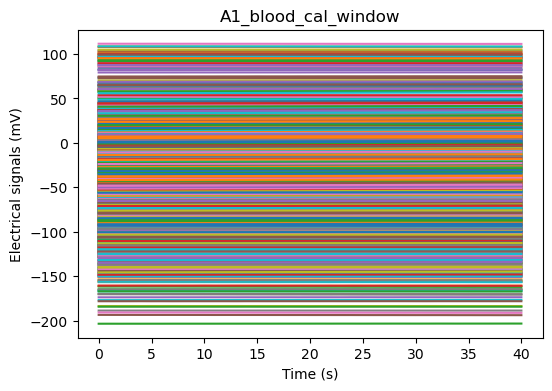

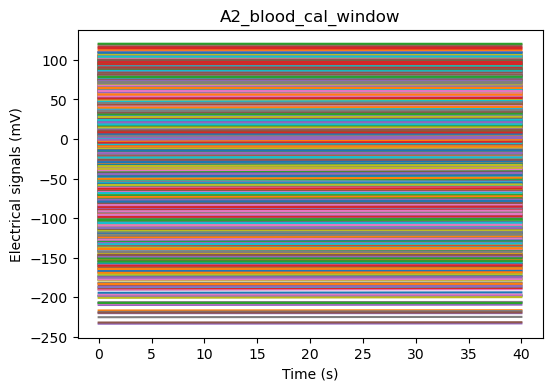

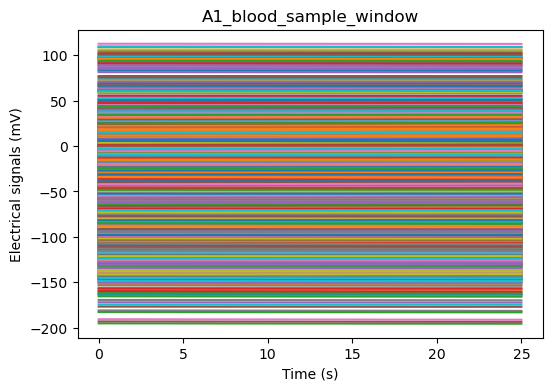

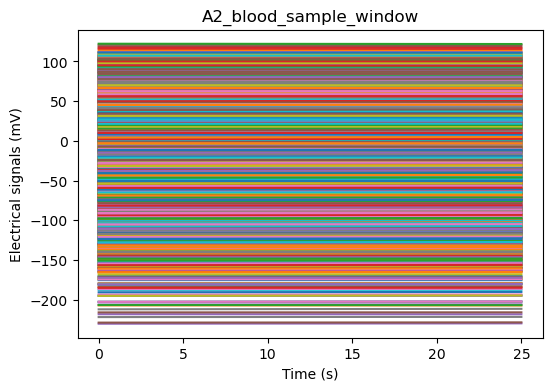

In [14]:
# Plot all the time series from the window extraction
plot_all_time_series(A1_blood_cal_window, "A1_blood_cal_window")
plot_all_time_series(A2_blood_cal_window, "A2_blood_cal_window")
plot_all_time_series(A1_blood_sample_window, "A1_blood_sample_window")
plot_all_time_series(A2_blood_sample_window, "A2_blood_sample_window")

### System 1 and System 2: Sensor A - Aqueous - Cal and Sample Windows

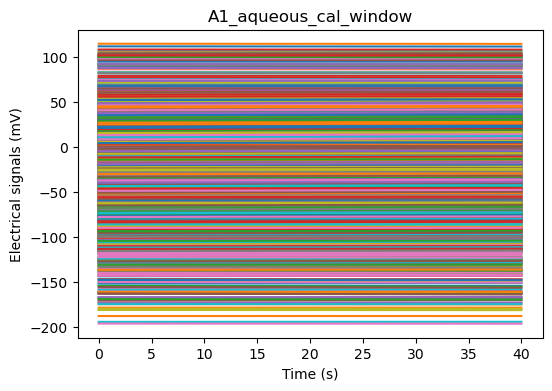

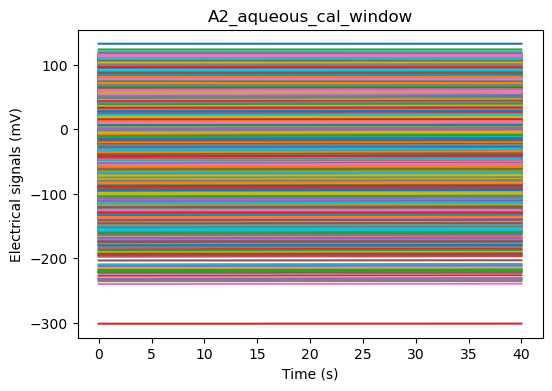

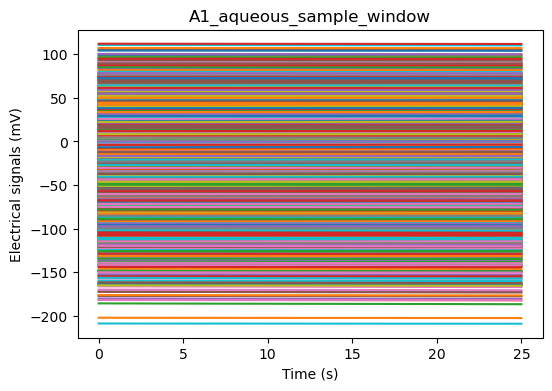

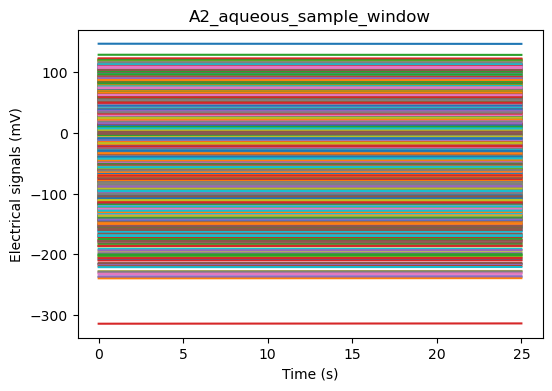

In [15]:
# Plot all the time series from the window extraction
plot_all_time_series(A1_aqueous_cal_window, "A1_aqueous_cal_window")
plot_all_time_series(A2_aqueous_cal_window, "A2_aqueous_cal_window")
plot_all_time_series(A1_aqueous_sample_window, "A1_aqueous_sample_window")
plot_all_time_series(A2_aqueous_sample_window, "A2_aqueous_sample_window")

### System 1 and System 2: Sensor B - Blood - Cal and Sample Windows

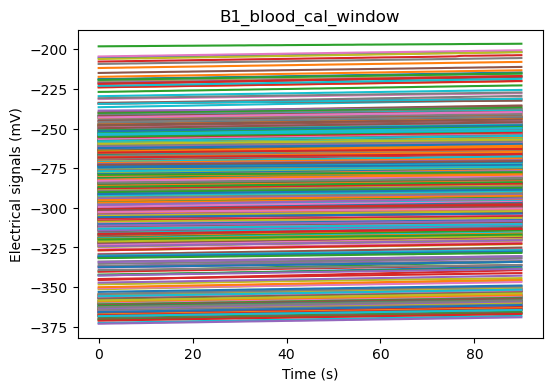

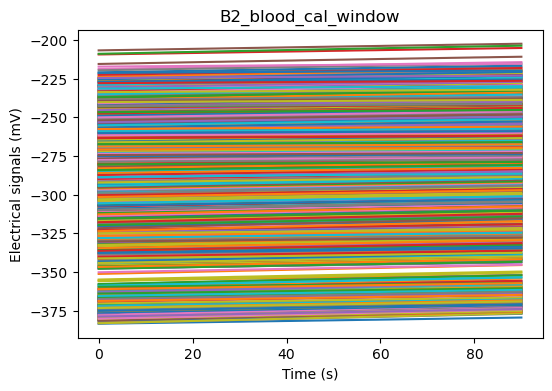

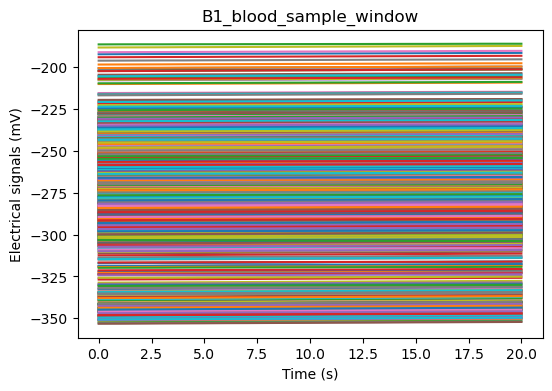

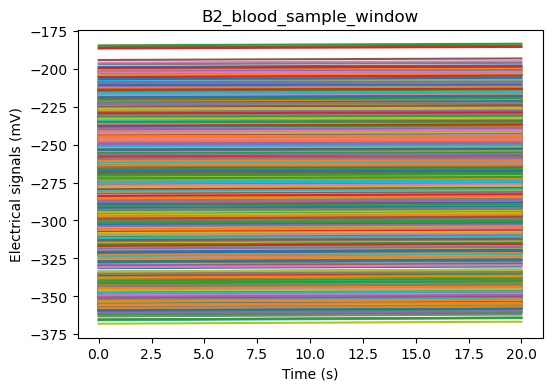

In [16]:
# Plot all the time series from the window extraction
plot_all_time_series(B1_blood_cal_window, "B1_blood_cal_window")
plot_all_time_series(B2_blood_cal_window, "B2_blood_cal_window")
plot_all_time_series(B1_blood_sample_window, "B1_blood_sample_window")
plot_all_time_series(B2_blood_sample_window, "B2_blood_sample_window")

### System 1 and System 2: Sensor B - Aqueous - Cal and Sample Windows

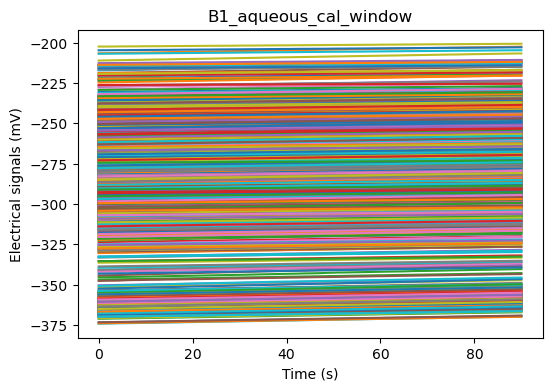

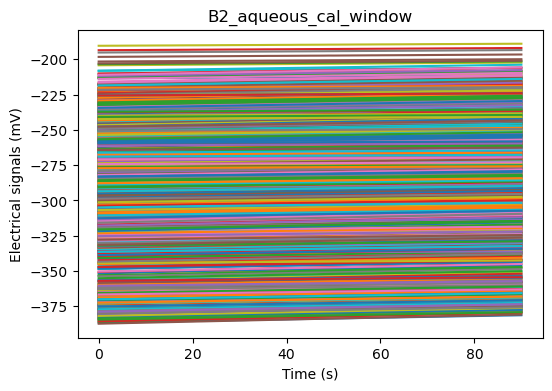

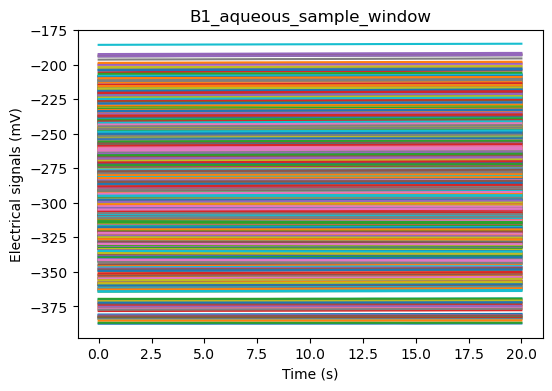

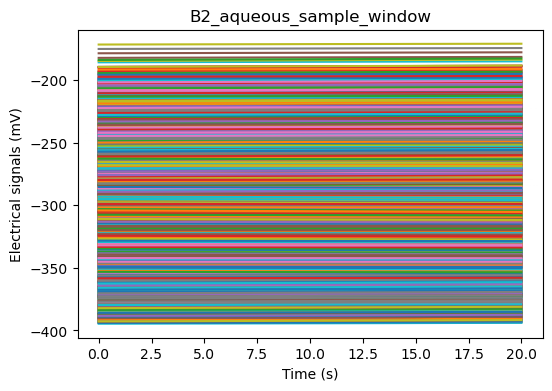

In [17]:
# Plot all the time series from the window extraction
plot_all_time_series(B1_aqueous_cal_window, "B1_aqueous_cal_window")
plot_all_time_series(B2_aqueous_cal_window, "B2_aqueous_cal_window")
plot_all_time_series(B1_aqueous_sample_window, "B1_aqueous_sample_window")
plot_all_time_series(B2_aqueous_sample_window, "B2_aqueous_sample_window")

## 8. Functional Principal Components

In [18]:
def perform_functional_pca(data_matrix, y_axis_min=None, y_axis_max=None, color_fpc1=None, color_fpc2=None):
    """
    Performs Functional Principal Component Analysis (FPCA) on a given data matrix and plots the results.

    Parameters:
    data_matrix (pd.DataFrame): A pandas DataFrame where each row represents a time series and each column represents a time point.
    y_axis_min (float, optional): The minimum value for the y-axis in the plots. Defaults to None.
    y_axis_max (float, optional): The maximum value for the y-axis in the plots. Defaults to None.
    color_fpc1 (str, optional): The color for the first functional principal component plot. Defaults to None.
    color_fpc2 (str, optional): The color for the second functional principal component plot. Defaults to None.

    Returns:
    None

    Prints:
    - The explained variance ratio of the first and second functional principal components.
    - The functional principal component scores for each time series.
    - The index and TestID of the time series contributing most to the first and second principal components.

    Plots:
    - The first and second functional principal components.
    - The individual plots of the first and second functional principal components.
    """
    fd = FDataGrid(data_matrix=data_matrix, grid_points=data_matrix.columns.astype(float))

    # Apply Functional PCA
    fpca = FPCA(n_components=2, centering=True)
    fpca.fit(fd)
    pc_scores = fpca.transform(fd)

    # Explain variance ratio
    print('Explain variance FPC1 (%): ', fpca.explained_variance_ratio_[0] * 100)
    print('Explain variance FPC2 (%): ', fpca.explained_variance_ratio_[1] * 100)

    # --- Loadings ---
    # Extract the principal components (loadings)
    principal_components = fpca.components_
    
    # Extract loadings for each time point from the first and second principal components
    loadings_pc1 = principal_components.data_matrix[0, :, 0]  # Loadings for the first PC
    loadings_pc2 = principal_components.data_matrix[1, :, 0]  # Loadings for the second PC
    loadings_df = pd.DataFrame({
    'PC1_Loadings': loadings_pc1,
    'PC2_Loadings': loadings_pc2}, index=[f'TimePoint_{i}' for i in range(data_matrix.shape[1])])
    #print("\nLoadings:\n", loadings_df)

    # --- Scores ---
    # Print the scores to see contributions of each time series to each principal component
    pc_scores_df = pd.DataFrame(pc_scores, columns=['PC1_Scores', 'PC2_Scores'],
                                index=[data_matrix.index[i] for i in range(data_matrix.shape[0])])
    print("FPC Scores:\n", pc_scores_df)

    # Identify which time series (functional data object) contributes the most to each principal component
    max_contribution_index_pc1 = np.argmax(np.abs(pc_scores[:, 0]))  # Index of the maximum absolute score in the first PC
    max_contribution_index_pc2 = np.argmax(np.abs(pc_scores[:, 1]))  # Index of the maximum absolute score in the second PC

    print(f'The time series contributing most to PC1 is at index {max_contribution_index_pc1} with TestID {data_matrix.index[max_contribution_index_pc1]}')
    print(f'The time series contributing most to PC2 is at index {max_contribution_index_pc2} with TestID {data_matrix.index[max_contribution_index_pc2]}')
    
    # --- Plotting Principal Components ---
    fig, axs = plt.subplots(1, 3, figsize=(12, 3))

    # Both Functional PC's
    axs[0].plot(fpca.components_[0].grid_points[0], fpca.components_[0].data_matrix[0].flatten(), linestyle='-', label='Component 1', color = color_fpc1)
    axs[0].plot(fpca.components_[1].grid_points[0], fpca.components_[1].data_matrix[0].flatten(), linestyle='-', label='Component 2', color = color_fpc2)
    axs[0].set_title("Functional Principal Components")
    axs[0].set_xlabel('Time')
    axs[0].set_ylabel('Functional PC Values')
    axs[0].legend()
    axs[0].grid(True)
    axs[0].set_ylim(y_axis_min, y_axis_max)

    # FPC1
    axs[1].plot(fpca.components_[0].grid_points[0], fpca.components_[0].data_matrix[0].flatten(), linestyle='-', label='Component 1', color = color_fpc1)
    axs[1].set_title("Functional Component 1")
    axs[1].set_xlabel('Time')
    axs[1].set_ylabel('')
    axs[1].legend()
    axs[1].grid(True)
    axs[1].set_ylim(y_axis_min, y_axis_max)

    # FPC2
    axs[2].plot(fpca.components_[1].grid_points[0], fpca.components_[1].data_matrix[0].flatten(), linestyle='-', label='Component 2', color = color_fpc2)
    axs[2].set_title("Functional Component 2")
    axs[2].set_xlabel('Time')
    axs[2].set_ylabel('')
    axs[2].legend()
    axs[2].grid(True)
    axs[2].set_ylim(y_axis_min, y_axis_max)

    # Adjust layout
    plt.tight_layout()

    # Show the plot
    plt.show()

In [19]:
# Note: For the following plots we can adjust the y-axis limit with the parameters y_axis_min and y_axis_max from the function perform_functional_pca().
# If these parameters are not provided then the plots will display the default range, however, we should be aware of this.
# For instance: perform_functional_pca(A1_blood_cal_window, y_axis_min=-0.6, y_axis_max=0.6)

# ----------------------------------------- Sensor A -----------------------------------------------

# Cal Window

## Cal Window: System 1/2 - Blood

Explain variance FPC1 (%):  99.99903631073362
Explain variance FPC2 (%):  0.0009600297561910576
FPC Scores:
           PC1_Scores  PC2_Scores
12414372 -629.834138    1.125510
12414373 -595.400743    1.159224
12414374 -621.052115    1.234430
12414375 -596.268795    1.117465
12414377 -647.688876    1.506192
...              ...         ...
12470355  438.399068    1.051695
12470361  543.245842    0.948795
12470365  -16.820129   -0.712827
12539049  -95.990977   -0.456802
12622570  842.798898    1.376544

[1433 rows x 2 columns]
The time series contributing most to PC1 is at index 1042 with TestID 12573667
The time series contributing most to PC2 is at index 828 with TestID 12598120


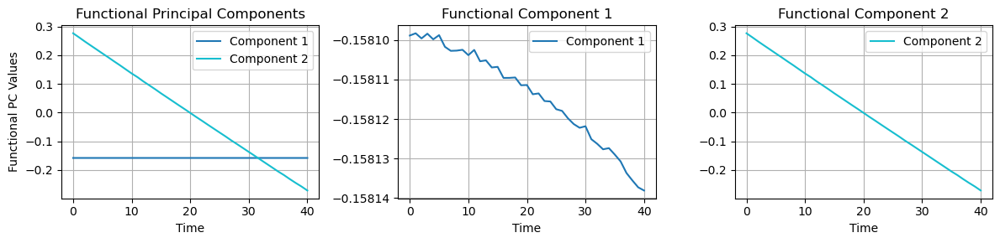

Explain variance FPC1 (%):  99.99906857395065
Explain variance FPC2 (%):  0.0009301235568349274
FPC Scores:
          PC1_Scores  PC2_Scores
3545083 -662.093661   -0.602325
3545084 -615.121571   -0.657180
3545085 -504.392395   -0.939915
3545086 -575.088528   -0.584950
3545087 -533.968128   -0.606537
...             ...         ...
3518583 -485.081960   -0.837439
3518675 -546.443438   -0.497373
3518676 -278.596442   -0.164655
3518677 -218.308876   -0.283972
3518678   -9.373598   -0.426781

[2851 rows x 2 columns]
The time series contributing most to PC1 is at index 2134 with TestID 3572300
The time series contributing most to PC2 is at index 2425 with TestID 3567819


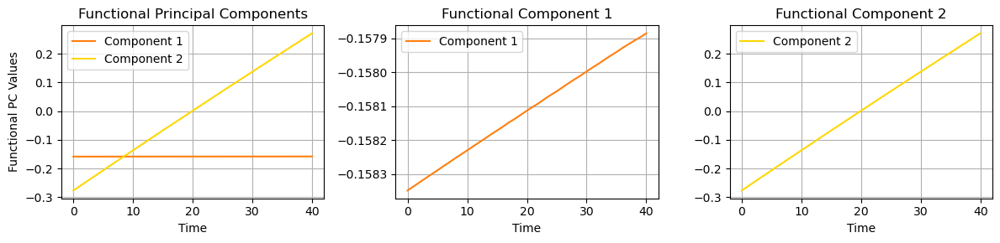

In [20]:
perform_functional_pca(A1_blood_cal_window, color_fpc1='tab:blue', color_fpc2='tab:cyan')
perform_functional_pca(A2_blood_cal_window, color_fpc1='tab:orange', color_fpc2='gold')

## Cal Window: System 1/2 - aqueous

Explain variance FPC1 (%):  99.99897848822089
Explain variance FPC2 (%):  0.0010178976351314772
FPC Scores:
           PC1_Scores  PC2_Scores
12414200 -462.087918    0.763512
12414201 -382.037994    0.147045
12414202 -478.114282    0.644482
12414203 -463.134005    0.583172
12414204 -519.278366    0.730928
...              ...         ...
12624891  -73.066419   -0.388430
12624893 -106.371122   -0.357111
12537663 -158.307970   -1.640461
12572832  530.084041    1.049927
12572836  -54.676812   -0.281475

[1949 rows x 2 columns]
The time series contributing most to PC1 is at index 1836 with TestID 12572826
The time series contributing most to PC2 is at index 1915 with TestID 12599845


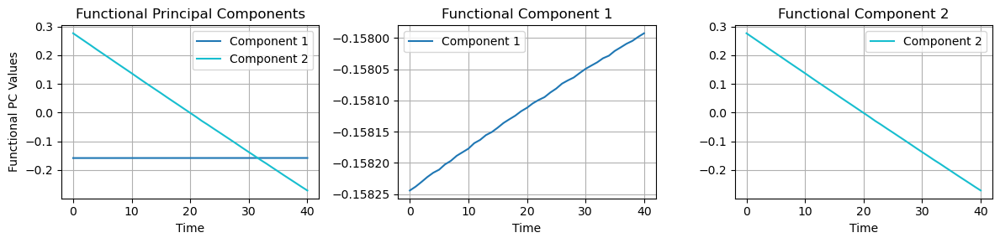

Explain variance FPC1 (%):  99.9989197116501
Explain variance FPC2 (%):  0.0010787672065730176
FPC Scores:
          PC1_Scores  PC2_Scores
3550995 -206.053189   -1.077145
3551012 -130.318139   -1.183188
3551031 -288.689649   -1.609394
3551047 -211.483163   -1.053547
3551065 -196.241950   -1.217631
...             ...         ...
3518442 -464.011127   -0.007725
3518443 -161.605834    0.014085
3518444 -172.479863    0.241987
3518445   62.302993    0.366918
3518456 -543.887857   -0.224722

[4892 rows x 2 columns]
The time series contributing most to PC1 is at index 3763 with TestID 3556087
The time series contributing most to PC2 is at index 3212 with TestID 3561214


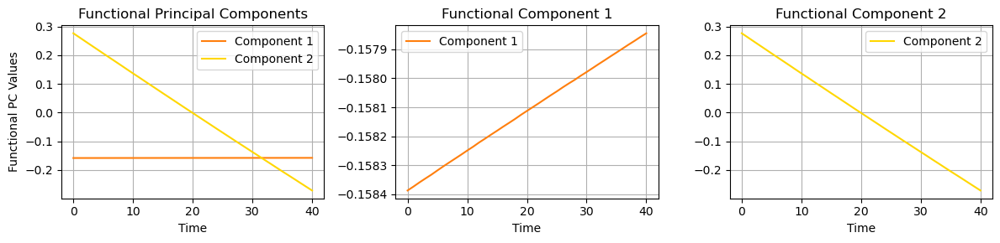

In [21]:
perform_functional_pca(A1_aqueous_cal_window, color_fpc1='tab:blue', color_fpc2='tab:cyan')
perform_functional_pca(A2_aqueous_cal_window, color_fpc1='tab:orange', color_fpc2='gold')

# Sample Window

## Sample Window: System 1/2 - Blood

Explain variance FPC1 (%):  99.99968073771691
Explain variance FPC2 (%):  0.0003159921089964731
FPC Scores:
           PC1_Scores  PC2_Scores
12414372 -489.991060   -0.487655
12414373 -462.556423   -0.512182
12414374 -482.558618   -0.494353
12414375 -463.166186   -0.505013
12414377 -501.402449   -0.648148
...              ...         ...
12470355  354.788097   -0.472507
12470361  436.176632   -0.382653
12470365  -20.093376    0.305902
12539049  -80.128410    0.205203
12622570  673.848396   -0.589146

[1433 rows x 2 columns]
The time series contributing most to PC1 is at index 1042 with TestID 12573667
The time series contributing most to PC2 is at index 191 with TestID 12615995


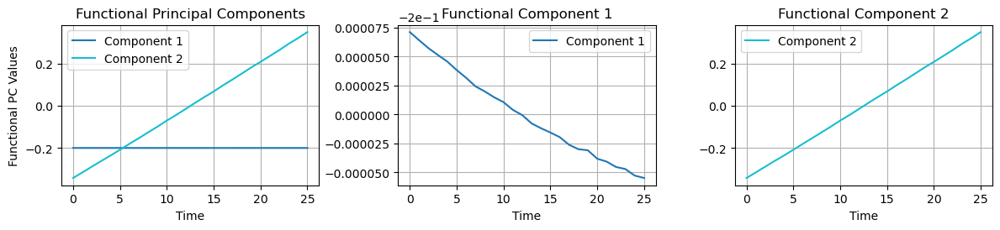

Explain variance FPC1 (%):  99.99967378883693
Explain variance FPC2 (%):  0.00032544211243883397
FPC Scores:
          PC1_Scores  PC2_Scores
3545083 -512.212132    0.385979
3545084 -475.258103    0.367990
3545085 -386.138345    0.526379
3545086 -443.990923    0.361591
3545087 -411.462628    0.411256
...             ...         ...
3518583 -371.872177    0.297401
3518675 -423.336847    0.042892
3518676 -217.550510   -0.004423
3518677 -167.827267    0.023680
3518678   -2.695489    0.070072

[2851 rows x 2 columns]
The time series contributing most to PC1 is at index 2134 with TestID 3572300
The time series contributing most to PC2 is at index 1064 with TestID 3569143


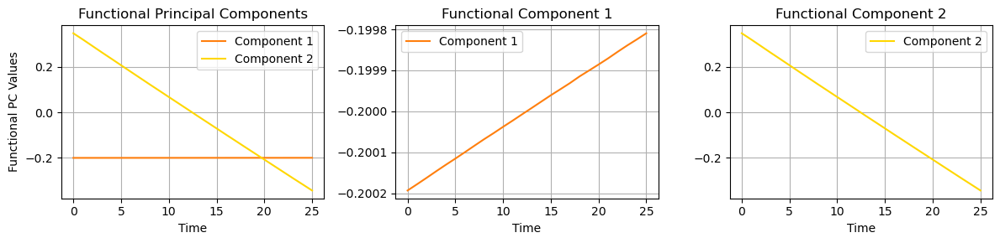

In [22]:
perform_functional_pca(A1_blood_sample_window, color_fpc1='tab:blue', color_fpc2='tab:cyan')
perform_functional_pca(A2_blood_sample_window, color_fpc1='tab:orange', color_fpc2='gold')

## Sample Window: System 1/2 - Aqueous

Explain variance FPC1 (%):  99.9997397699384
Explain variance FPC2 (%):  0.0002563812100120807
FPC Scores:
           PC1_Scores  PC2_Scores
12414200 -331.793213    0.200776
12414201 -273.086557   -0.085186
12414202 -345.673634    0.186102
12414203 -333.986049    0.150885
12414204 -377.504851    0.178938
...              ...         ...
12624891    1.522530   -0.142170
12624893  -20.629385   -0.178693
12537663 -211.788851   -0.471412
12572832  343.858423    0.222142
12572836 -123.379271    0.100331

[1949 rows x 2 columns]
The time series contributing most to PC1 is at index 1739 with TestID 12574513
The time series contributing most to PC2 is at index 462 with TestID 12191350


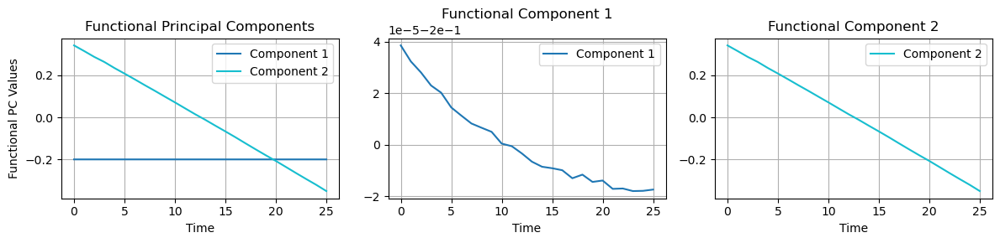

Explain variance FPC1 (%):  99.99965614804258
Explain variance FPC2 (%):  0.000341939700292416
FPC Scores:
          PC1_Scores  PC2_Scores
3550995 -207.851308   -0.420527
3551012 -149.246733   -0.452776
3551031 -277.594030   -0.693856
3551047 -212.221089   -0.440526
3551065 -201.652602   -0.507344
...             ...         ...
3518442 -302.378709    0.178153
3518443  -64.199228    0.346386
3518444  -69.378455    0.474823
3518445  114.550773    0.657388
3518456 -366.250703    0.059213

[4892 rows x 2 columns]
The time series contributing most to PC1 is at index 3763 with TestID 3556087
The time series contributing most to PC2 is at index 3212 with TestID 3561214


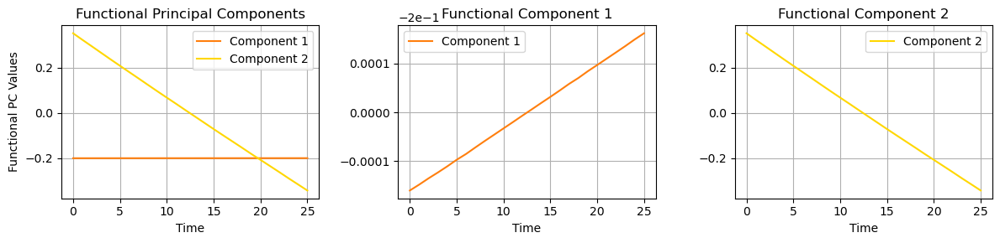

In [23]:
perform_functional_pca(A1_aqueous_sample_window, color_fpc1='tab:blue', color_fpc2='tab:cyan')
perform_functional_pca(A2_aqueous_sample_window, color_fpc1='tab:orange', color_fpc2='gold')

# ------------------------------------- Sensor B ------------------------------------------------

## Cal Window:  System 1/2 - Blood

Explain variance FPC1 (%):  99.99402628874086
Explain variance FPC2 (%):  0.005943245121920705
FPC Scores:
           PC1_Scores  PC2_Scores
12414372  370.691377    2.814008
12414373  373.625801    2.822501
12414374  407.810233    3.268249
12414375  405.188164    3.143201
12414377  365.695460    2.549781
...              ...         ...
12470355 -117.699988   -3.399520
12470361   60.284807   -1.418356
12470365  125.647578   -0.829341
12539049  129.244533   -1.050934
12622570   -7.563354   -1.747086

[1431 rows x 2 columns]
The time series contributing most to PC1 is at index 472 with TestID 12437598
The time series contributing most to PC2 is at index 203 with TestID 12615993


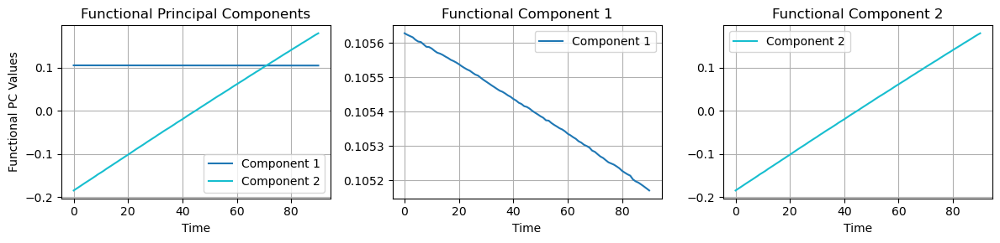

Explain variance FPC1 (%):  99.9937450960967
Explain variance FPC2 (%):  0.006235825869662605
FPC Scores:
          PC1_Scores  PC2_Scores
3545083  542.405894    3.544643
3545084  531.495469    3.188401
3545085  458.332247    2.269276
3545086  544.628557    3.788931
3545087  455.449713    3.318268
...             ...         ...
3518583  578.831070   -6.471654
3518675  603.310206   -6.095167
3518676  425.468952   -5.943599
3518677  412.730241   -7.148036
3518678  311.542760   -7.127060

[2852 rows x 2 columns]
The time series contributing most to PC1 is at index 195 with TestID 3548448
The time series contributing most to PC2 is at index 2426 with TestID 3567819


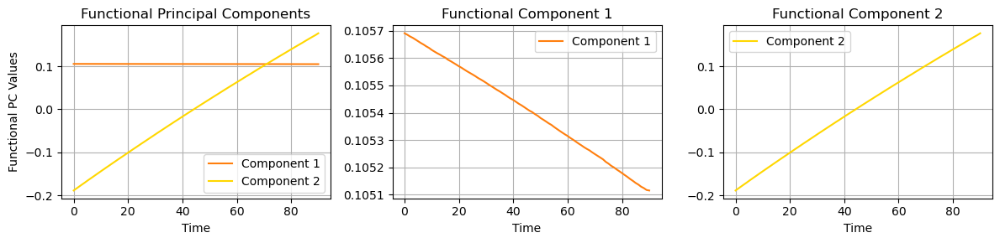

In [24]:
perform_functional_pca(B1_blood_cal_window, color_fpc1='tab:blue', color_fpc2='tab:cyan')
perform_functional_pca(B2_blood_cal_window, color_fpc1='tab:orange', color_fpc2='gold')

## Cal Window:  System 1/2 - Aqueous

Explain variance FPC1 (%):  99.99429965213402
Explain variance FPC2 (%):  0.005674922119799839
FPC Scores:
           PC1_Scores  PC2_Scores
12414200 -280.735614    3.616149
12414201 -273.224911    3.950660
12414202 -290.152444    3.608065
12414203 -307.783676    3.319943
12414204 -354.889295    3.775659
...              ...         ...
12537664 -246.348852    2.054196
12537668 -172.027863    0.162744
12624891  119.129034   -2.287491
12624893   39.841893   -2.576547
12537663 -137.189694    0.334835

[1944 rows x 2 columns]
The time series contributing most to PC1 is at index 219 with TestID 12544066
The time series contributing most to PC2 is at index 1681 with TestID 12395731


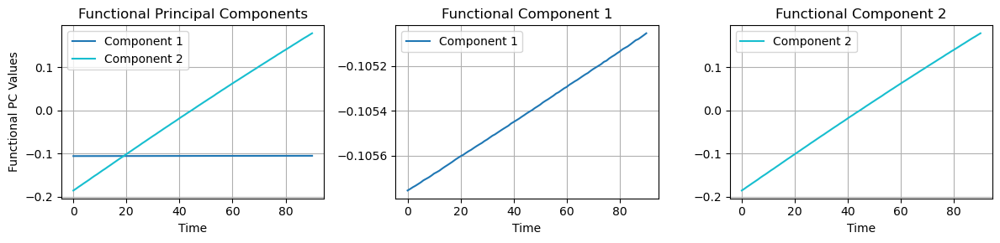

Explain variance FPC1 (%):  99.99541540509125
Explain variance FPC2 (%):  0.004567289166225346
FPC Scores:
          PC1_Scores  PC2_Scores
3550995  107.739368    0.463722
3551012   10.189149   -0.872549
3551031  315.567684   -0.174101
3551047  189.279095    1.082127
3551065  104.327362    0.521352
...             ...         ...
3518442  585.567207   -5.789235
3518443  331.635655   -6.783318
3518444  422.866251   -6.959739
3518445  254.501070   -6.843832
3518456  634.603988   -5.829742

[4893 rows x 2 columns]
The time series contributing most to PC1 is at index 418 with TestID 3556268
The time series contributing most to PC2 is at index 2526 with TestID 3567091


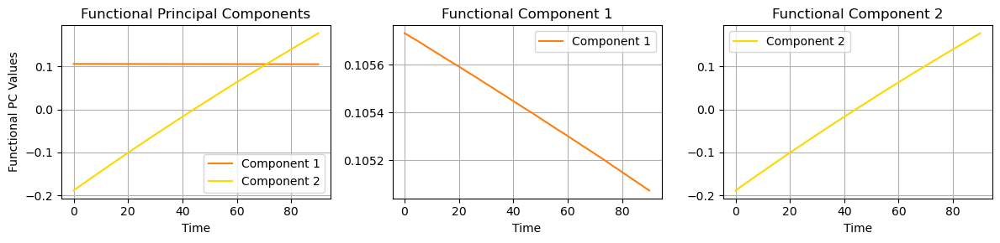

In [25]:
perform_functional_pca(B1_aqueous_cal_window, color_fpc1='tab:blue', color_fpc2='tab:cyan')
perform_functional_pca(B2_aqueous_cal_window, color_fpc1='tab:orange', color_fpc2='gold')

## Sample Window:  System 1/2 - Blood

Explain variance FPC1 (%):  99.99960570010492
Explain variance FPC2 (%):  0.00038319366738212953
FPC Scores:
           PC1_Scores  PC2_Scores
12414372  181.515317   -0.364285
12414373  181.024980   -0.286146
12414374  198.557303   -0.380726
12414375  197.413445   -0.320340
12414377  176.746543   -0.313972
...              ...         ...
12470355  -69.309641    0.335421
12470361   18.321632    0.122327
12470365   48.214436    0.196206
12539049   45.960486    0.105386
12622570  -24.515683    0.151136

[1431 rows x 2 columns]
The time series contributing most to PC1 is at index 472 with TestID 12437598
The time series contributing most to PC2 is at index 1044 with TestID 12623840


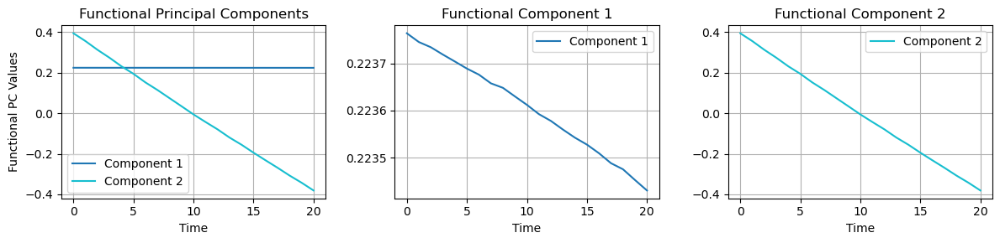

Explain variance FPC1 (%):  99.99974702797147
Explain variance FPC2 (%):  0.0002506909087978033
FPC Scores:
          PC1_Scores  PC2_Scores
3545083  261.294239   -0.335643
3545084  254.301284   -0.312213
3545085  217.609479   -0.168808
3545086  260.735559   -0.308287
3545087  219.692205   -0.292579
...             ...         ...
3518583  248.067240    0.516560
3518675  238.324538    0.523473
3518676  156.944003    0.554370
3518677  146.018127    0.728834
3518678  100.489548    0.707769

[2852 rows x 2 columns]
The time series contributing most to PC1 is at index 212 with TestID 3548492
The time series contributing most to PC2 is at index 2825 with TestID 3518645


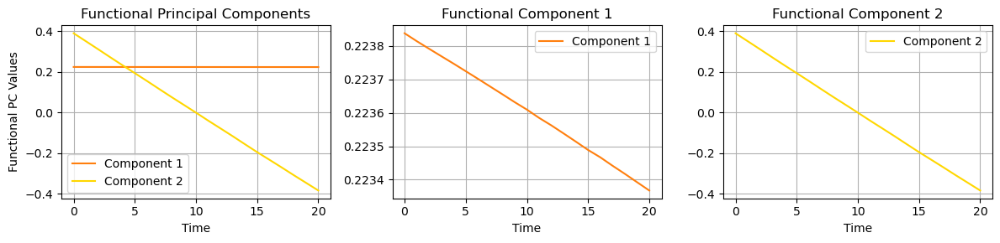

In [26]:
perform_functional_pca(B1_blood_sample_window, color_fpc1='tab:blue', color_fpc2='tab:cyan')
perform_functional_pca(B2_blood_sample_window, color_fpc1='tab:orange', color_fpc2='gold')

## Sample Window:  System 1/2 - Aqueous

Explain variance FPC1 (%):  99.998305816487
Explain variance FPC2 (%):  0.0016859486597204346
FPC Scores:
           PC1_Scores  PC2_Scores
12414200 -114.560449   -0.255879
12414201 -112.407429   -0.163802
12414202 -117.550602   -0.178482
12414203 -124.392031   -0.092398
12414204 -150.182943   -0.190947
...              ...         ...
12537664 -230.051653   -0.051437
12537668 -191.120924   -0.126594
12624891  194.100589    0.659053
12624893  172.427585    1.171202
12537663 -175.678694   -0.037155

[1944 rows x 2 columns]
The time series contributing most to PC1 is at index 240 with TestID 12546591
The time series contributing most to PC2 is at index 452 with TestID 12191207


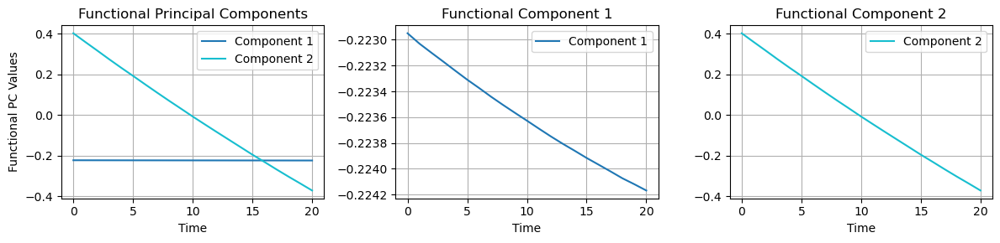

Explain variance FPC1 (%):  99.99911546907217
Explain variance FPC2 (%):  0.000881394344609002
FPC Scores:
          PC1_Scores  PC2_Scores
3550995  128.095012   -0.248638
3551012   77.311894   -0.145738
3551031  219.111875   -0.100257
3551047  164.959339   -0.230717
3551065  125.789176   -0.218458
...             ...         ...
3518442  116.113714    2.281318
3518443   -4.613311    2.235800
3518444   38.327432    2.268484
3518445  -46.489611    2.595079
3518456  139.737984    2.193040

[4893 rows x 2 columns]
The time series contributing most to PC1 is at index 418 with TestID 3556268
The time series contributing most to PC2 is at index 4868 with TestID 3518458


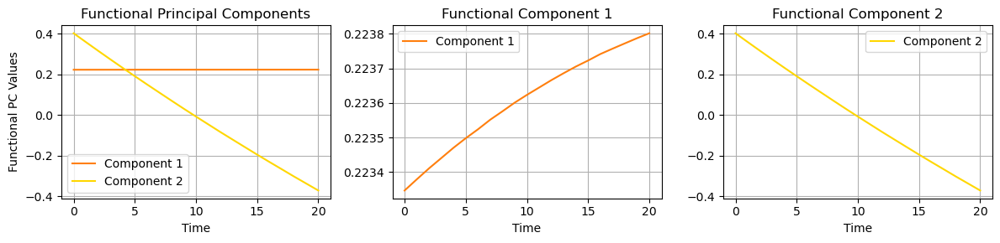

In [27]:
perform_functional_pca(B1_aqueous_sample_window, color_fpc1='tab:blue', color_fpc2='tab:cyan')
perform_functional_pca(B2_aqueous_sample_window, color_fpc1='tab:orange', color_fpc2='gold')

## 8.1. Functional PCA characterization function

In [28]:
def fpca_two_inputs(time_series_s1, time_series_s2, y_axis_min=None, y_axis_max=None):
    """
    Performs Functional Principal Component Analysis (FPCA) on two sets of time series data from different systems
    and plots the first principal component for both systems on the same graph.

    Parameters:
    time_series_s1 (pd.DataFrame): A pandas DataFrame representing time series data from System 1. Each row represents
                                   a time series and each column represents a time point.
    time_series_s2 (pd.DataFrame): A pandas DataFrame representing time series data from System 2. Each row represents
                                   a time series and each column represents a time point.
    y_axis_min (float, optional): The minimum value for the y-axis in the plot. Defaults to None.
    y_axis_max (float, optional): The maximum value for the y-axis in the plot. Defaults to None.

    Returns:
    tuple: A tuple containing two pandas DataFrames representing the functional principal component scores for System 1
           and System 2 respectively.

    Prints:
    - The explained variance ratio of the first principal component for both systems.
    - The functional principal component scores for each time series in both systems.
    - Plots the first principal component for both systems on the same graph.

    """
    # Convert the data matrix to an FDataGrid object
    fd_s1 = FDataGrid(data_matrix=time_series_s1, grid_points=time_series_s1.columns.astype(float)) # System 1
    fd_s2 = FDataGrid(data_matrix=time_series_s2, grid_points=time_series_s2.columns.astype(float)) # System 2

    # Apply Functional PCA for System 1
    fpca_s1 = FPCA(n_components=2, centering=True)
    fpca_s1.fit(fd_s1)
    fpc_and_scores_s1 = fpca_s1.transform(fd_s1)
    
    # Apply Functional PCA for System 2
    fpca_s2 = FPCA(n_components=2)
    fpca_s2.fit(fd_s2)
    fpc_and_scores_s2 = fpca_s2.transform(fd_s2)

    # --- Explain variance ratio ---
    # System 1
    print('S1 Explain variance PC1 (%): ', fpca_s1.explained_variance_ratio_[0] * 100)
    #print('S1 Explain variance PC2 (%): ', fpca_s1.explained_variance_ratio_[1] * 100)
    # System 2
    print('S2 Explain variance PC1 (%): ', fpca_s2.explained_variance_ratio_[0] * 100)
    #print('S2 Explain variance PC2 (%): ', fpca_s2.explained_variance_ratio_[1] * 100)

    # --- Loadings ---
    # Extract the principal components (loadings)
    principal_components_s1 = fpca_s1.components_ # System 1
    principal_components_s2 = fpca_s2.components_ # System 2

    # --- Scores ---
    # Print the scores to see contributions of each time series to each principal component

    # System 1
    pc_scores_s1 = pd.DataFrame(fpc_and_scores_s1, columns=['PC1_Scores', 'PC2_Scores'],
                                index=[time_series_s1.index[i] for i in range(time_series_s1.shape[0])])
    # System 2
    pc_scores_s2 = pd.DataFrame(fpc_and_scores_s2, columns=['PC1_Scores', 'PC2_Scores'],
                                index=[time_series_s2.index[i] for i in range(time_series_s2.shape[0])])

    # --- Plotting First Principal Component for both Systems ---
    # Extracting data for System 1
    x1 = fpca_s1.components_[0].grid_points[0] 
    y1 = fpca_s1.components_[0].data_matrix[0].flatten()

    # Extracting data for System 2
    x2 = fpca_s2.components_[0].grid_points[0] 
    y2 = fpca_s2.components_[0].data_matrix[0].flatten()

    # Plotting both curves in the same graph
    fig = plt.figure(figsize=(5, 3))
    plt.plot(x1, y1, linestyle='-', label='Component 1 - S1')
    plt.plot(x2, y2, linestyle='-', label='Component 1 - S2')

    plt.legend()
    plt.grid(True)
    plt.xlabel('Time')
    plt.ylabel('Functional PC 1 Values')
    plt.title('System 1 versus System 2')
    plt.ylim(y_axis_min, y_axis_max)
    plt.show()

    return pc_scores_s1, pc_scores_s2

In [29]:
def create_pc_scores_plots(pc_scores_s1, pc_scores_s2, features_s1, features_s2):
    """
    Creates scatterplots for the functional principal component scores mapping with colors the additional features for every TestID for two systems.

    Parameters:
    pc_scores_s1 (pd.DataFrame): A pandas DataFrame representing the functional principal component scores for System 1.
    pc_scores_s2 (pd.DataFrame): A pandas DataFrame representing the functional principal component scores for System 2.
    features_s1 (pd.DataFrame): A pandas DataFrame representing additional features for System 1.
    features_s2 (pd.DataFrame): A pandas DataFrame representing additional features for System 2.

    Returns:
    scatterplots: A concatenated chart containing scatterplots of the functional principal component scores combined with additional features for both systems.
    """
    # --- Scores combined with Additional Features ---
    # Reset the index, making the index a column in the DataFrame
    pc_scores_s1_reset = pc_scores_s1.reset_index()
    pc_scores_s2_reset = pc_scores_s2.reset_index()
    pc_scores_s1_reset.rename(columns={'index': 'TestID'}, inplace=True)
    pc_scores_s2_reset.rename(columns={'index': 'TestID'}, inplace=True)

    # Merging functional pc scores and additional features by TestID
    system1_scores_merged = pd.merge(pc_scores_s1_reset, features_s1, how='inner', on=['TestID'])
    system2_scores_merged = pd.merge(pc_scores_s2_reset, features_s2, how='inner', on=['TestID'])

    # --- Characterization of the Functional PC Scores ---

    # Select Features
    selected_columns = ['TestID', 'PC1_Scores','PC2_Scores','FluidType','AgeOfCardInDaysAtTimeOfTest', 'AmbientTemperature', 'Fluid_Temperature_Filled']
    data_s1 = system1_scores_merged[selected_columns].copy()
    data_s2 = system2_scores_merged[selected_columns].copy()

    # Binning continuous predictors into discrete intervals
    data_s1.loc[:, 'AmbientTempBin'] = pd.cut(data_s1['AmbientTemperature'],  bins=[-1, 20, 26, 100], labels=['Below 20', '20-26', 'Above 26'])
    data_s2.loc[:, 'AmbientTempBin'] = pd.cut(data_s2['AmbientTemperature'],  bins=[-1, 20, 26, 100], labels=['Below 20', '20-26', 'Above 26'])
    data_s1.loc[:, 'FluidTempBin'] = pd.cut(data_s1['Fluid_Temperature_Filled'],  bins=[-1, 20, 26, 100], labels=['Below 20', '20-26', 'Above 26'])
    data_s2.loc[:, 'FluidTempBin'] = pd.cut(data_s2['Fluid_Temperature_Filled'],  bins=[-1, 20, 26, 100], labels=['Below 20', '20-26', 'Above 26'])

    # CardAge by bins of 28 days 
    # Determine the max age to set the range for bins
    max_age = data_s2['AgeOfCardInDaysAtTimeOfTest'].max()+1 

    # Define the custom bins without duplicates
    bins_age = [0, 10, 28] + list(np.arange(56, max_age + 28, 28))

    # Create labels for the bins
    labels_age = ['[0-9]', '(9-28]'] + [f'({i}-{i+28}]' for i in np.arange(28, max_age, 28)]
        
    # Assign bins to the AgeBin column
    data_s1.loc[:, 'AgeBin'] = pd.cut(data_s1['AgeOfCardInDaysAtTimeOfTest'], bins=bins_age, labels=labels_age)
    data_s2.loc[:, 'AgeBin'] = pd.cut(data_s2['AgeOfCardInDaysAtTimeOfTest'], bins=bins_age, labels=labels_age)
  
    # --- Define a color map for fluid types ---
    color_map_temp = {
        'Below 20': '#4e79a7',
        '20-26': '#f28e2b',
        'Above 26': '#e16759',
    }

    # Combine data to get the overall min and max for both axes
    combined_data = pd.concat([data_s1, data_s2])

    # Determine the range for x and y axes
    min_x = combined_data['PC1_Scores'].min()
    max_x = combined_data['PC1_Scores'].max()
    min_y = combined_data['PC2_Scores'].min()
    max_y = combined_data['PC2_Scores'].max()

    # --- Visualizations ---
    # System 1
    scatter_age_s1 = alt.Chart(data_s1).mark_circle().encode(
        alt.X('PC1_Scores').axis(title="FPC Score 1").scale(domain=[min_x, max_x]),
        alt.Y('PC2_Scores').axis(title="FPC Score 2").scale(domain=[min_y, max_y]),
        color=alt.Color('AgeBin', scale=alt.Scale(scheme='tableau10'), title="Days"),
        tooltip=['TestID', 'PC1_Scores', 'PC2_Scores', alt.Tooltip('AgeOfCardInDaysAtTimeOfTest', title="Card Age")]
    ).properties(
        title='Card Age',
        width=280,
        height=280
    )

    scatter_temp_s1 = alt.Chart(data_s1).mark_circle().encode(
        alt.X('PC1_Scores').axis(title="FPC Score 1").scale(domain=[min_x, max_x]),
        alt.Y('PC2_Scores').axis(title="FPC Score 2").scale(domain=[min_y, max_y]),
        color=alt.Color('AmbientTempBin', scale=alt.Scale(domain=list(color_map_temp.keys()), range=list(color_map_temp.values())), title="°C"),
        tooltip=['TestID', 'PC1_Scores', 'PC2_Scores', alt.Tooltip('AmbientTemperature', title="Ambient Temperature")]
    ).properties(
        title='Ambient Temperature',
        width=280,
        height=280
    )

    scatter_fluid_s1 = alt.Chart(data_s1).mark_circle().encode(
        alt.X('PC1_Scores').axis(title="FPC Score 1").scale(domain=[min_x, max_x]),
        alt.Y('PC2_Scores').axis(title="FPC Score 2").scale(domain=[min_y, max_y]),
        color=alt.Color('FluidType', scale=alt.Scale(scheme='tableau10'), title="Fluid"),
        tooltip=['TestID', 'PC1_Scores', 'PC2_Scores', alt.Tooltip('FluidType', title="Fluid Type")]
    ).properties(
        title='Fluid Type',
        width=280,
        height=280
    )

    scatter_fluidTemp_s1 = alt.Chart(data_s1).mark_circle().encode(
        alt.X('PC1_Scores').axis(title="FPC Score 1").scale(domain=[min_x, max_x]),
        alt.Y('PC2_Scores').axis(title="FPC Score 2").scale(domain=[min_y, max_y]),
        color=alt.Color('FluidTempBin', scale=alt.Scale(domain=list(color_map_temp.keys()), range=list(color_map_temp.values())), title="°C"),
        tooltip=['TestID', 'PC1_Scores', 'PC2_Scores', alt.Tooltip('Fluid_Temperature_Filled', title="Fluid Temperature")]
    ).properties(
        title='Fluid Temperature',
        width=280,
        height=280
    )

    # System 2
    scatter_age_s2 = alt.Chart(data_s2).mark_circle().encode(
        alt.X('PC1_Scores').axis(title="FPC Score 1").scale(domain=[min_x, max_x]),
        alt.Y('PC2_Scores').axis(title="FPC Score 2").scale(domain=[min_y, max_y]),
        color=alt.Color('AgeBin', scale=alt.Scale(scheme='tableau10'), title="Days"),
        tooltip=['TestID', 'PC1_Scores', 'PC2_Scores', alt.Tooltip('AgeOfCardInDaysAtTimeOfTest', title="Card Age")]
    ).properties(
        title='Card Age',
        width=280,
        height=280
    )

    scatter_temp_s2 = alt.Chart(data_s2).mark_circle().encode(
        alt.X('PC1_Scores').axis(title="FPC Score 1").scale(domain=[min_x, max_x]),
        alt.Y('PC2_Scores').axis(title="FPC Score 2").scale(domain=[min_y, max_y]),
        color=alt.Color('AmbientTempBin', scale=alt.Scale(domain=list(color_map_temp.keys()), range=list(color_map_temp.values())), title="°C"),
        tooltip=['TestID', 'PC1_Scores', 'PC2_Scores', alt.Tooltip('AmbientTemperature', title="Ambient Temperature")]
    ).properties(
        title='Ambient Temperature',
        width=280,
        height=280
    )

    scatter_fluid_s2 = alt.Chart(data_s2).mark_circle().encode(
        alt.X('PC1_Scores').axis(title="FPC Score 1").scale(domain=[min_x, max_x]),
        alt.Y('PC2_Scores').axis(title="FPC Score 2").scale(domain=[min_y, max_y]),
        color=alt.Color('FluidType', scale=alt.Scale(scheme='tableau10'), title="Fluid"),
        tooltip=['TestID', 'PC1_Scores', 'PC2_Scores', alt.Tooltip('FluidType', title="Fluid Type")]
    ).properties(
        title='Fluid Type',
        width=280,
        height=280
    )

    scatter_fluidTemp_s2 = alt.Chart(data_s2).mark_circle().encode(
        alt.X('PC1_Scores').axis(title="FPC Score 1").scale(domain=[min_x, max_x]),
        alt.Y('PC2_Scores').axis(title="FPC Score 2").scale(domain=[min_y, max_y]),
        color=alt.Color('FluidTempBin', scale=alt.Scale(domain=list(color_map_temp.keys()), range=list(color_map_temp.values())), title="°C"),
        tooltip=['TestID', 'PC1_Scores', 'PC2_Scores', alt.Tooltip('Fluid_Temperature_Filled', title="Fluid Temperature")]
    ).properties(
        title='Fluid Temperature',
        width=280,
        height=280
    )

    # --- Display the plots ---
    # System 1 plots
    s1_plots = alt.hconcat(
        scatter_fluid_s1, scatter_age_s1, scatter_temp_s1, scatter_fluidTemp_s1
    ).resolve_scale(
        color='independent'
    ).properties(
        title='System 1'
    )

    # System 2 plots
    s2_plots = alt.hconcat(
        scatter_fluid_s2, scatter_age_s2, scatter_temp_s2, scatter_fluidTemp_s2
    ).resolve_scale(
        color='independent'
    ).properties(
        title='System 2'
    )

    # Concatenating plots in same grid
    plots_vconcatenated = alt.vconcat(
        s1_plots,
        s2_plots
    ).configure_view(
        stroke=None
    )

    return plots_vconcatenated

# 8.1.1. Functional PC1 plots (both systems) and Characterization of FPC Scores

### System 1 versus System 2: Sensor A - Blood - Cal Window

S1 Explain variance PC1 (%):  99.99903631073364
S2 Explain variance PC1 (%):  99.99906857395065


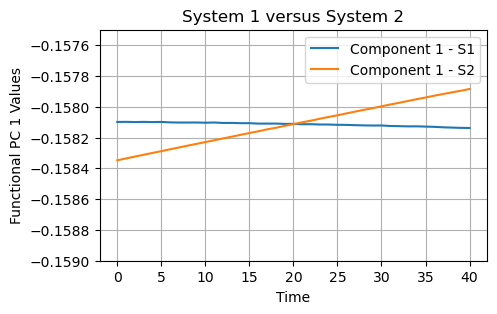

alt.VConcatChart(...)

In [30]:
pc_scores_s1_A_blood_cal_window, pc_scores_s2_A_blood_cal_window = fpca_two_inputs(A1_blood_cal_window, A2_blood_cal_window, y_axis_min = -0.1590, y_axis_max = -0.1575)
create_pc_scores_plots(pc_scores_s1_A_blood_cal_window, pc_scores_s2_A_blood_cal_window, A1_Merged, A2_Merged)

### System 1 versus System 2: Sensor A - Aqueous - Cal Window

S1 Explain variance PC1 (%):  99.99897848822087
S2 Explain variance PC1 (%):  99.99891971165013


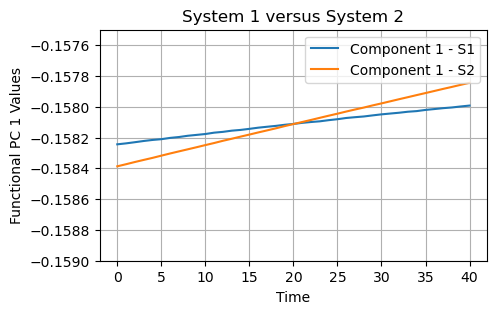

alt.VConcatChart(...)

In [31]:
pc_scores_s1_A_aqueous_cal_window, pc_scores_s2_A_aqueous_cal_window = fpca_two_inputs(A1_aqueous_cal_window, A2_aqueous_cal_window, y_axis_min = -0.1590, y_axis_max = -0.1575)
create_pc_scores_plots(pc_scores_s1_A_aqueous_cal_window, pc_scores_s2_A_aqueous_cal_window, A1_Merged, A2_Merged)

### System 1 versus System 2: Sensor A - Blood - Sample Window

S1 Explain variance PC1 (%):  99.99968073771691
S2 Explain variance PC1 (%):  99.99967378883693


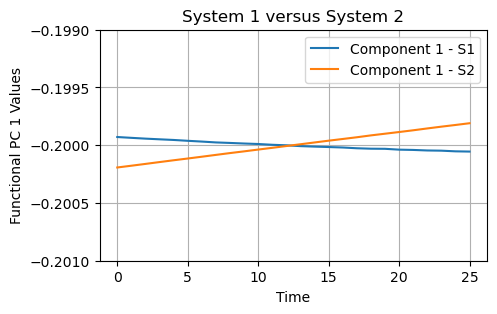

alt.VConcatChart(...)

In [32]:
pc_scores_s1_A_blood_sample_window, pc_scores_s2_A_blood_sample_window = fpca_two_inputs(A1_blood_sample_window, A2_blood_sample_window, y_axis_min = -0.2010, y_axis_max = -0.1990)
create_pc_scores_plots(pc_scores_s1_A_blood_sample_window, pc_scores_s2_A_blood_sample_window, A1_Merged, A2_Merged)

### System 1 versus System 2: Sensor A - Aqueous - Sample Window

S1 Explain variance PC1 (%):  99.9997397699384
S2 Explain variance PC1 (%):  99.99965614804258


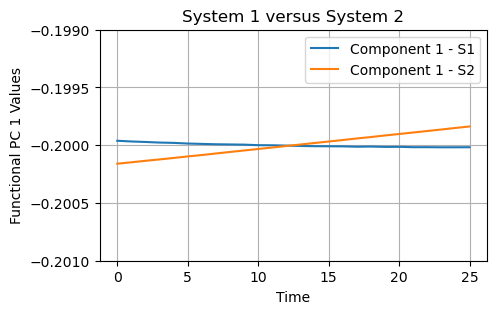

alt.VConcatChart(...)

In [33]:
pc_scores_s1_A_aqueous_sample_window, pc_scores_s2_A_aqueous_sample_window = fpca_two_inputs(A1_aqueous_sample_window, A2_aqueous_sample_window, y_axis_min = -0.2010, y_axis_max = -0.1990)
create_pc_scores_plots(pc_scores_s1_A_aqueous_sample_window, pc_scores_s2_A_aqueous_sample_window, A1_Merged, A2_Merged)

### System 1 versus System 2: Sensor B - Aqueous - Cal Window

S1 Explain variance PC1 (%):  99.99429965213402
S2 Explain variance PC1 (%):  99.99541540509125


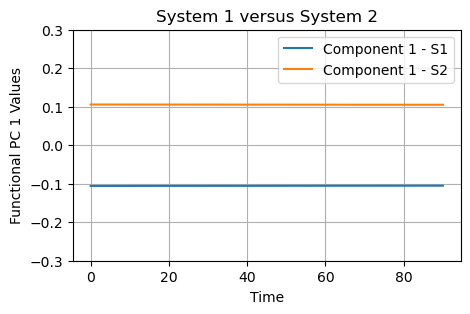

alt.VConcatChart(...)

In [34]:
pc_scores_s1_B_aqueous_cal_window, pc_scores_s2_B_aqueous_cal_window = fpca_two_inputs(B1_aqueous_cal_window, B2_aqueous_cal_window, y_axis_min = -0.30, y_axis_max = 0.30)
create_pc_scores_plots(pc_scores_s1_B_aqueous_cal_window, pc_scores_s2_B_aqueous_cal_window, B1_Merged, B2_Merged)

### System 1 versus System 2: Sensor B - Aqueous - Sample Window

S1 Explain variance PC1 (%):  99.99830581648695
S2 Explain variance PC1 (%):  99.9991154690721


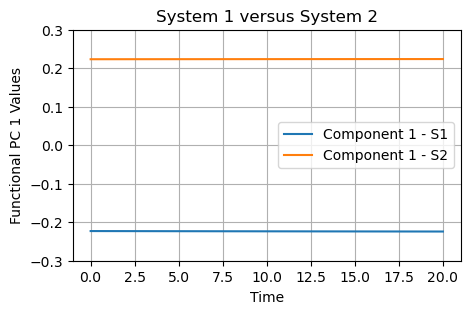

alt.VConcatChart(...)

In [35]:
pc_scores_s1_B_aqueous_sample_window, pc_scores_s2_B_aqueous_sample_window = fpca_two_inputs(B1_aqueous_sample_window, B2_aqueous_sample_window, y_axis_min = -0.30, y_axis_max = 0.30)
create_pc_scores_plots(pc_scores_s1_B_aqueous_sample_window, pc_scores_s2_B_aqueous_sample_window, B1_Merged, B2_Merged)

### System 1 versus System 2: Sensor B - Blood - Cal Window

S1 Explain variance PC1 (%):  99.99402628874086
S2 Explain variance PC1 (%):  99.99374509609666


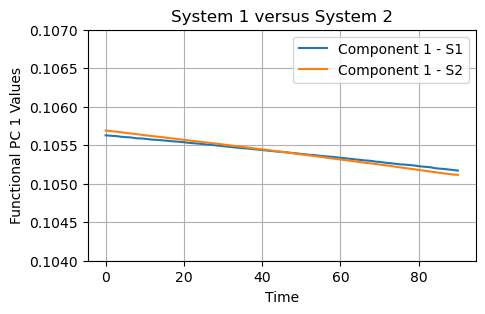

alt.VConcatChart(...)

In [36]:
pc_scores_s1_B_blood_cal_window, pc_scores_s2_B_blood_cal_window = fpca_two_inputs(B1_blood_cal_window, B2_blood_cal_window, y_axis_min = 0.104, y_axis_max = 0.107)
create_pc_scores_plots(pc_scores_s1_B_blood_cal_window, pc_scores_s2_B_blood_cal_window, B1_Merged, B2_Merged)

### System 1 versus System 2: Sensor B - Blood - Sample Window

S1 Explain variance PC1 (%):  99.99960570010492
S2 Explain variance PC1 (%):  99.99974702797138


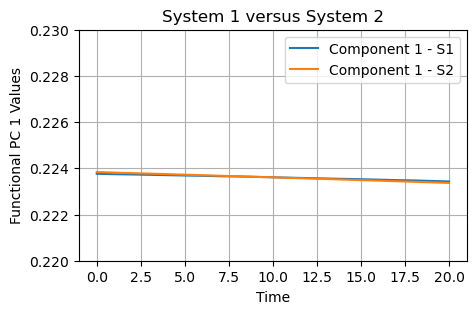

alt.VConcatChart(...)

In [37]:
pc_scores_s1_B_blood_sample_window, pc_scores_s2_B_blood_sample_window = fpca_two_inputs(B1_blood_sample_window, B2_blood_sample_window, y_axis_min = 0.22, y_axis_max = 0.23)
create_pc_scores_plots(pc_scores_s1_B_blood_sample_window, pc_scores_s2_B_blood_sample_window, B1_Merged, B2_Merged)